# Part A (Deep Leanrning)

In [ ]:
import os
import glob
import shutil

import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mimg
import tensorflow as tf

# Import packages for data handling
import h5py
from PIL import Image
from skimage.io import imread
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from mlxtend.plotting import plot_confusion_matrix

# Import deep learning package (tensorflow)
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.applications import mobilenet_v2
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Input, Flatten, SeparableConv2D
from tensorflow.keras.layers import GlobalAveragePooling2D, BatchNormalization, Concatenate
from tensorflow.keras.optimizers import Adam, RMSprop, AdamW
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

color = sns.color_palette()
%matplotlib inline

# Set seed nunmber to all packages
seed_number = 24
np.random.seed(seed_number)
tf.random.set_seed(seed_number)

In [ ]:
# !kaggle datasets download -d faber24/lcc-fasd
# !unzip -q lcc-fasd.zip -d /content/lcc-fasd

In [ ]:
!kaggle datasets download -d ahmedruhshan/lcc-fasd-casia-combined


Dataset URL: https://www.kaggle.com/datasets/ahmedruhshan/lcc-fasd-casia-combined
License(s): CC0-1.0
100% 4.88G/4.89G [01:12<00:00, 129MB/s]
100% 4.89G/4.89G [01:12<00:00, 72.0MB/s]


In [ ]:
!unzip -q lcc-fasd-casia-combined.zip -d /content/lcc-fasd-casia-combined

In [ ]:
# Configuring directories

# root = "/content/lcc-fasd"
root = "/content/lcc-fasd-casia-combined/lcc-fasd-casia"
input_dir = os.path.join(root,"LCC_FASD")
train_dir = os.path.join(input_dir, 'LCC_FASD_training')
val_dir = os.path.join(input_dir, 'LCC_FASD_development')
test_dir = os.path.join(input_dir, 'LCC_FASD_evaluation')

dataset_dir = [dir for dir in sorted(os.listdir(input_dir)) if os.path.isdir(os.path.join(input_dir, dir))]
label_name = [subdir for subdir in sorted(os.listdir(train_dir)) if os.path.isdir(os.path.join(train_dir, subdir))]

# Printing the directory informations
print(f"Main directories\t: {os.listdir(root)}")
print(f"Dataset sub-directories\t: {dataset_dir}")
print(f"Train set directory\t: {label_name}")

Main directories	: ['LCC_FASD']
Dataset sub-directories	: ['LCC_FASD_development', 'LCC_FASD_evaluation', 'LCC_FASD_training']
Train set directory	: ['real', 'spoof']


In [ ]:
def balance_dataset(directory):

    all_files = os.listdir(directory)

    image_extensions = {'.jpg', '.jpeg', '.png', '.gif', '.bmp'}
    images = [file for file in all_files if os.path.splitext(file)[1].lower() in image_extensions]

    # Calculate the number of images to keep
    num_images_to_keep = len(images) // 2

    # Select the first one-third of the images
    images_to_keep = images[:num_images_to_keep]
    images_to_delete = set(images) - set(images_to_keep)

    # Delete unselected images
    for image in images_to_delete:
        os.remove(os.path.join(directory, image))

In [ ]:
directory1 = os.path.join(train_dir, 'spoof')
directory2 = os.path.join(val_dir, 'spoof')
directory3 = os.path.join(test_dir, 'spoof')
balance_dataset(directory1)
balance_dataset(directory2)
balance_dataset(directory3)

In [ ]:
dir_dict = {'train': train_dir, 'val': val_dir, 'test': test_dir}
case_count, img_disp, set_length  = {}, {}, {}

for key, val in dir_dict.items():
    case_count[key] = {}
    img_disp[key] = {}
    set_count = 0

    for label in label_name:
        label_list = list(sorted(glob.glob(os.path.join(val, label, "*.png"))))
        if len(label_list) == 0:
          continue

        case_count[key][label] = len(label_list)
        set_count += len(label_list)

        select_img_id = np.random.randint(len(label_list)-1)
        # print(select_img_id)
        img_disp[key][label] = label_list[select_img_id]

    set_length[key] = set_count

case_count_df = pd.DataFrame(case_count)
img_disp_df = pd.DataFrame(img_disp)
print(f"Dataset summary:\n\n{case_count_df}")

Dataset summary:

       train   val  test
real    1302   416   323
spoof   3722  1295  3656


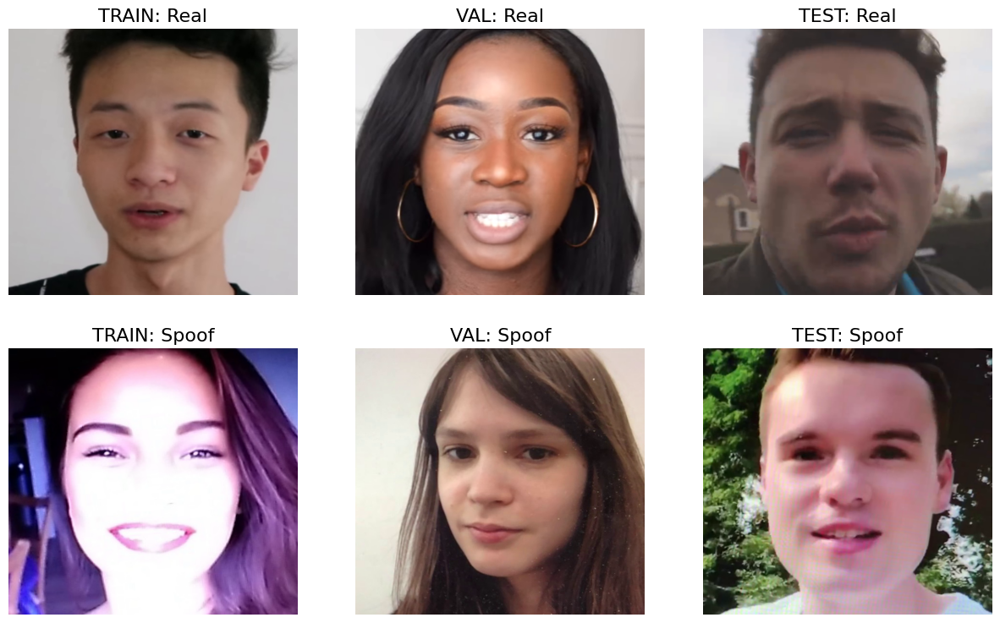

In [ ]:
# Visualizing some of the data set
num_classes = len(label_name)
num_dataset = 0
for key, val in set_length.items():
  num_dataset += 1 if val > 0 else 0

f, ax = plt.subplots(num_classes, num_dataset, figsize=(num_dataset*5, 9))

for k in range(num_classes*num_dataset):
    j, i = k//num_dataset, k%num_dataset  # Image indexing

    img = imread(img_disp_df.iloc[j, i])
    ax[j, i].imshow(img, cmap='gray')
    ax[j, i].set_title(f"{img_disp_df.columns[i].upper()}: {img_disp_df.index[j].capitalize()}", fontsize=16)
    ax[j, i].axis('off')
    ax[j, i].set_aspect('auto')
plt.show()

In [ ]:
# Instantiate data generator for training procedure
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   rotation_range = 20,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.15,
                                   zoom_range = 0.15,
                                   horizontal_flip = True,
                                   fill_mode="nearest")

val_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale=1./255) if set_length["test"] > 0 else None

In [ ]:
# Define dataset properties
train_batch_size = 32
val_batch_size = 32
img_width = 224
img_height = 224

# Generate dataset for train, val and test
train_gen = train_datagen.flow_from_directory(train_dir,
                                              batch_size = train_batch_size,
                                              class_mode = 'binary',
                                              target_size = (img_width, img_height),
                                              seed = seed_number)

val_gen = val_datagen.flow_from_directory(val_dir,
                                          batch_size = val_batch_size,
                                          class_mode = 'binary',
                                          target_size = (img_width, img_height),
                                          seed = seed_number)

if test_datagen is not None:
  test_gen = test_datagen.flow_from_directory(test_dir,
                                              batch_size = 1,
                                              class_mode = 'binary',
                                              target_size = (img_width, img_height),
                                              seed = seed_number,
                                              shuffle=True)
else:
  test_gen = None

Found 5024 images belonging to 2 classes.
Found 1711 images belonging to 2 classes.
Found 3979 images belonging to 2 classes.


In [ ]:
# Displaying the dataset generator information
print(f'Train set batch shape\t: {next(train_gen)[0].shape}')
print(f'Val set batch shape\t: {next(val_gen)[0].shape}')
print(f'Test set batch shape\t: {next(test_gen)[0].shape}') if test_gen is not None else None

# Print the mapping of class labels to numerical values
print(train_gen.class_indices)
print(val_gen.class_indices)
print(test_gen.class_indices)

Train set batch shape	: (32, 224, 224, 3)
Val set batch shape	: (32, 224, 224, 3)
Test set batch shape	: (1, 224, 224, 3)
{'real': 0, 'spoof': 1}
{'real': 0, 'spoof': 1}
{'real': 0, 'spoof': 1}


In [ ]:
# Don't forget to turn on the Internet to download the respective pre-trained weights!
pretrain_net = mobilenet_v2.MobileNetV2(input_shape = (img_width, img_height, 3),
                                        include_top = False,
                                        weights = 'imagenet')

# load_param_path = '../input/mobilenet_v2/xception_weights_tf_dim_ordering_tf_kernels_notop.h5'  # Offline alternative
# pretrain_net.load_weights(load_param_path)  # Manually load the weights from the input directory

# ------ Freezing layer(s) up to a specific layer ------
freeze_before = None  #"block_16_expand"  # use None to train, use "all" to freeze all the layers

if freeze_before:
    for layer in pretrain_net.layers:
        if layer.name == freeze_before:
            break
        else:
            layer.trainable = False

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
# Adding extra layer for our problem
x = pretrain_net.output
x = Conv2D(32, (3, 3), activation='relu')(x)
x = Dropout(rate=0.2, name='extra_dropout1')(x)
x = GlobalAveragePooling2D()(x)
x = Dense(units=128, activation='relu', name='extra_fc1')(x)
x = Dropout(rate=0.2, name='extra_dropout2')(x)
x = Dense(1, activation='sigmoid', name='classifier')(x)

model = Model(inputs=pretrain_net.input, outputs=x, name='mobilenetv2_spoof')
print(model.summary())

Model: "mobilenetv2_spoof"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][

In [ ]:
train_id = "lcc-train04b-weight_all"  # ID of the training procedure
num_epochs = 15  # Set the number of epochs to train
learning_rate = 5e-5  # Set the learning rate to use

print(f"Training config of '{train_id}'...")
print(f"Number of epoch\t: {num_epochs}")
print(f"Initial LR\t: {learning_rate}")

model.compile(optimizer = AdamW(lr=learning_rate),
              loss = 'binary_crossentropy',
              metrics = ['acc'])

# Define model callback
save_dir = os.path.join("./", train_id)
if not os.path.isdir(save_dir):
  os.makedirs(save_dir)

cont_filepath = "mobilenetv2-epoch_{epoch:02d}.hdf5"
cont_checkpoint = ModelCheckpoint(os.path.join(save_dir, cont_filepath))

best_filepath = "mobilenetv2-best.hdf5"
best_checkpoint = ModelCheckpoint(os.path.join(save_dir, best_filepath),
                                  save_best_only=True,
                                  save_weights_only=True)

# Instantiate learning rate scheduler with Plateau method
plateau_scheduler = ReduceLROnPlateau(factor=0.2, patience=2, verbose=1,
                                      min_delta= 0.005, min_lr=5e-7)


# Define class weight
train_length = len(train_gen.classes)
weight0 = train_length / case_count_df['train'][label_name[0]] * (1 / len(label_name))
weight1 = train_length / case_count_df['train'][label_name[1]] * (1 / len(label_name))
class_weight = {0: weight0, 1: weight1}

print(f"Class weight\t: {class_weight}")

Training config of 'lcc-train04b-weight_all'...
Number of epoch	: 15
Initial LR	: 5e-05
Class weight	: {0: 1.9293394777265744, 1: 0.6749059645351961}


In [ ]:
# Resume training (UNCOMMENT to use!)
# checkpoint_path = "mobilenetv2-epoch_01"
# model.load(os.path.join(savedir, checkpoint_path))

# Perform training
history = model.fit(train_gen,
                    epochs = num_epochs,
                    steps_per_epoch = set_length['train'] // train_batch_size,
                    validation_data = val_gen,
                    validation_steps = 1,
                    callbacks = [best_checkpoint,
                                 cont_checkpoint,
                                 plateau_scheduler],
                    class_weight=class_weight)

history_df = pd.DataFrame.from_dict(history.history)
history_df.to_csv(os.path.join(save_dir, "history.csv"), index=False)

# Notice: Unhide the OUTPUT!

Epoch 1/15
157/157 [==============================] - ETA: 0s - loss: 0.3092 - acc: 0.8656

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


157/157 [==============================] - 162s 811ms/step - loss: 0.3092 - acc: 0.8656 - val_loss: 3.2246 - val_acc: 0.8750 - lr: 0.0010
Epoch 2/15
157/157 [==============================] - 127s 809ms/step - loss: 0.1507 - acc: 0.9449 - val_loss: 10.8259 - val_acc: 0.7188 - lr: 0.0010
Epoch 3/15
157/157 [==============================] - ETA: 0s - loss: 0.1583 - acc: 0.9455
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
157/157 [==============================] - 126s 800ms/step - loss: 0.1583 - acc: 0.9455 - val_loss: 10.7860 - val_acc: 0.7500 - lr: 0.0010
Epoch 4/15
157/157 [==============================] - 126s 803ms/step - loss: 0.0827 - acc: 0.9678 - val_loss: 9.7400 - val_acc: 0.7812 - lr: 2.0000e-04
Epoch 5/15
157/157 [==============================] - ETA: 0s - loss: 0.0578 - acc: 0.9777
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
157/157 [==============================] - 127s 806ms/step - loss: 0.0578 - acc: 0.9

In [ ]:
train_accuracy = history.history['acc']
val_accuracy = history.history['val_acc']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

## Save Check Points in google drive

In [ ]:
from google.colab import drive
import shutil

drive.mount('/content/drive') # Mount Google Drive

source_dir = '/content/lcc-train04b-weight_all_balance2'
target_dir = '/content/drive/MyDrive/lcc-fasd-train-weight_all_balance2/'

# Copy the directory contents to Google Drive
shutil.copytree(source_dir, target_dir, dirs_exist_ok=True)

Mounted at /content/drive


'/content/drive/MyDrive/lcc-fasd-train-weight_all_balance2/'

In [ ]:
!pip install -U gdown -q

In [ ]:
# uncomment to load saved weights

import gdown
import pandas as pd

file_id = '1-pPJwbsNDs72EBAH8S5UxrUUgKQ_fOI1'
gdown.download(f'https://drive.google.com/uc?id={file_id}', 'model_weights.h5', quiet=False)

file_id = '1-_WuCtCvcHbm7LSUxvtqvka0tO_2g0uN'
gdown.download(f'https://drive.google.com/uc?id={file_id}', 'history.csv', quiet=False)

model.load_weights('model_weights.h5')
history_df = pd.read_csv('history.csv')
history = history_df.to_dict(orient='list')

train_accuracy = history['acc']
val_accuracy = history['val_acc']
train_loss = history['loss']
val_loss = history['val_loss']

model.compile(optimizer = Adam(lr=5e-5),
              loss = 'binary_crossentropy',
              metrics = ['acc'])

Downloading...
From: https://drive.google.com/uc?id=1-pPJwbsNDs72EBAH8S5UxrUUgKQ_fOI1
To: /content/model_weights.h5
100%|██████████| 10.9M/10.9M [00:00<00:00, 127MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-_WuCtCvcHbm7LSUxvtqvka0tO_2g0uN
To: /content/history.csv
100%|██████████| 1.20k/1.20k [00:00<00:00, 1.45MB/s]


## Results Evaluation

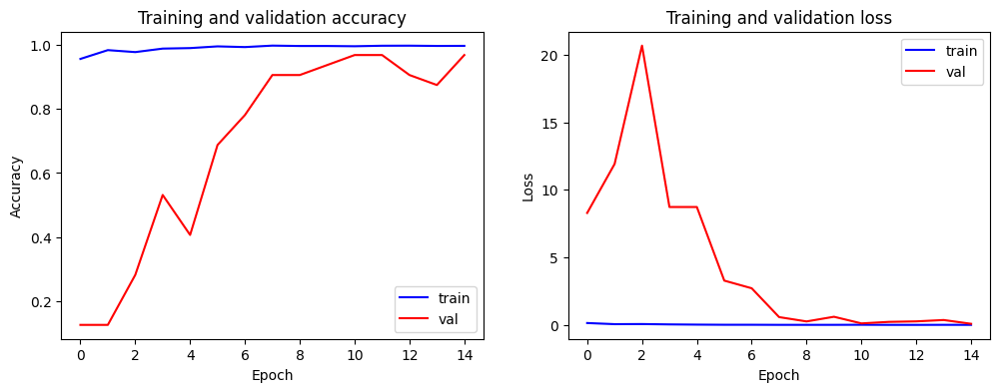

In [ ]:
# Plotting the train results
epochs = range(len(train_accuracy))
plt.figure(figsize=(12,4))

# Plotting the accuracy
plt.subplot(1,2,1)
plt.plot(epochs, train_accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['train', 'val'], loc='lower right')

# Plotting the loss
plt.subplot(1,2,2)
plt.plot(epochs, train_loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['train', 'val'], loc='upper right')

plt.show()

In [ ]:
# Test set accuracy and loss
test_scores = model.evaluate(test_gen, steps=set_length['test'])
print("Test results Accuracy: {:.2f}% and Loss: {:.2f}".format(test_scores[1]*100, test_scores[0]))

# Calculate prediction
threshold = 0.5  # Define the sigmoid threshold for True or False
y_pred_value = np.squeeze(model.predict(test_gen, steps=set_length['test'], verbose=1))

y_pred = np.zeros(y_pred_value.shape).astype(np.int32)  # Sigmoid
y_pred[y_pred_value > threshold] = 1

# y_pred = np.argmax(y_pred_value, axis=-1).astype(np.int32)  # Softmax

y_true = test_gen.classes

# Sanity check on the y_pred and y_true value
print(f"Label\t\t: {y_true[:30]}")
print(f"Prediction\t: {y_pred[:30]}")

3979/3979 [==============================] - 198s 49ms/step - loss: 0.1786 - acc: 0.9739
Test results Accuracy: 97.39% and Loss: 0.18
3979/3979 [==============================] - 187s 47ms/step
Label		: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Prediction	: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [ ]:
# Get predictions for the first 20 samples
num_samples_to_evaluate = 20
predictions = model.predict(test_gen, steps=num_samples_to_evaluate)

# Convert predictions to binary labels using threshold 0.5
predicted_labels = (predictions > 0.5).astype(int).flatten()

true_labels = test_gen.classes[:num_samples_to_evaluate]

comparison_df = pd.DataFrame({
    'True Label': true_labels,
    'Predicted Label': predicted_labels
})

print(comparison_df.head(20))

# Plot the images with their true and predicted labels
fig, axes = plt.subplots(num_samples_to_evaluate // 5, 5, figsize=(15, num_samples_to_evaluate ))
axes = axes.flatten()

for i in range(num_samples_to_evaluate):
    img, label = test_gen[i]
    axes[i].imshow(img[0])
    axes[i].set_title(f"True: {int(true_labels[i])}, Pred: {int(predicted_labels[i])}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

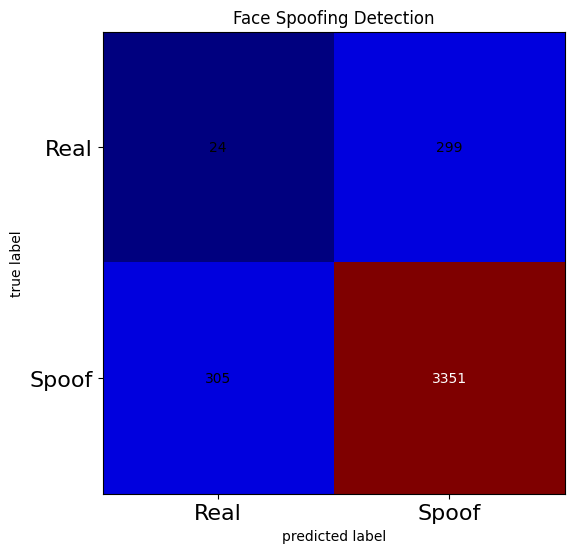

Report Summary:
Precision	: 91.81%
Recall		: 91.66%
F1 Score	: 91.73%

Notes: 
True labels	: Spoof
False labels	: Real


In [ ]:
# Confusion matrix result
confusion_matrix_result = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(confusion_matrix_result,
                      figsize=(10,6),
                      hide_ticks=True,
                      cmap=plt.cm.jet)
plt.title("Face Spoofing Detection")
plt.xticks(range(2), ['Real', 'Spoof'], fontsize=16)
plt.yticks(range(2), ['Real', 'Spoof'], fontsize=16)
plt.show()

# Precision and Recall metrics
tn, fp, fn, tp = confusion_matrix_result.ravel()
precision = tp / (tp+fp)
recall = tp / (tp+fn)
f1_score = 2 * precision * recall / (precision+recall)

print("Report Summary:")
print("Precision\t: {:.2f}%".format(precision*100))
print("Recall\t\t: {:.2f}%".format(recall*100))
print("F1 Score\t: {:.2f}%".format(f1_score*100))

print("\nNotes: ")
print("True labels\t: Spoof")
print("False labels\t: Real")

## Test with videos


In [ ]:
img_width, img_height = 224, 224  # Ensure this matches the input shape used during training

# Load face detection model (e.g., Haar Cascade)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Load your anti-spoofing model
anti_spoof_model = model  # Assuming your model is already defined and trained

def detect_faces(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    return faces

def preprocess_face(face):
    face = cv2.resize(face, (img_width, img_height))
    face = img_to_array(face)
    face = preprocess_input(face)
    face = np.expand_dims(face, axis=0)
    return face

def predict_spoof(face_image):
    processed_face = preprocess_face(face_image)
    pred = anti_spoof_model.predict(processed_face)
    return pred[0][0]

# Function to compute the Fourier Transform of an image
def compute_fourier_transform(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    f_transform = np.fft.fft2(gray_image)
    f_shift = np.fft.fftshift(f_transform)
    magnitude_spectrum = 20 * np.log(np.abs(f_shift) + 1)  # Adding 1 to avoid log(0)
    # Convert single channel to 3 channels
    magnitude_spectrum = cv2.merge([magnitude_spectrum, magnitude_spectrum, magnitude_spectrum])
    return magnitude_spectrum

In [ ]:
!kaggle datasets download -d trainingdatapro/ibeta-level-1-liveness-detection-dataset-part-1


Dataset URL: https://www.kaggle.com/datasets/trainingdatapro/ibeta-level-1-liveness-detection-dataset-part-1
License(s): Attribution-NonCommercial-NoDerivatives 4.0 International (CC BY-NC-ND 4.0)
 99% 2.78G/2.80G [00:36<00:00, 58.6MB/s]
100% 2.80G/2.80G [00:36<00:00, 82.3MB/s]


In [ ]:
!unzip -q ibeta-level-1-liveness-detection-dataset-part-1.zip -d /content/liveness-detection-dataset

In [ ]:
wdir = '/content/liveness-detection-dataset/notebook'

In [ ]:
# a list to store predictions
prediction_results = []

# Function to cap predictions at 1 if they exceed 1
def validate_prediction(pred):
    return min(1, pred)

1/1 [==============================] - 0s 52ms/step


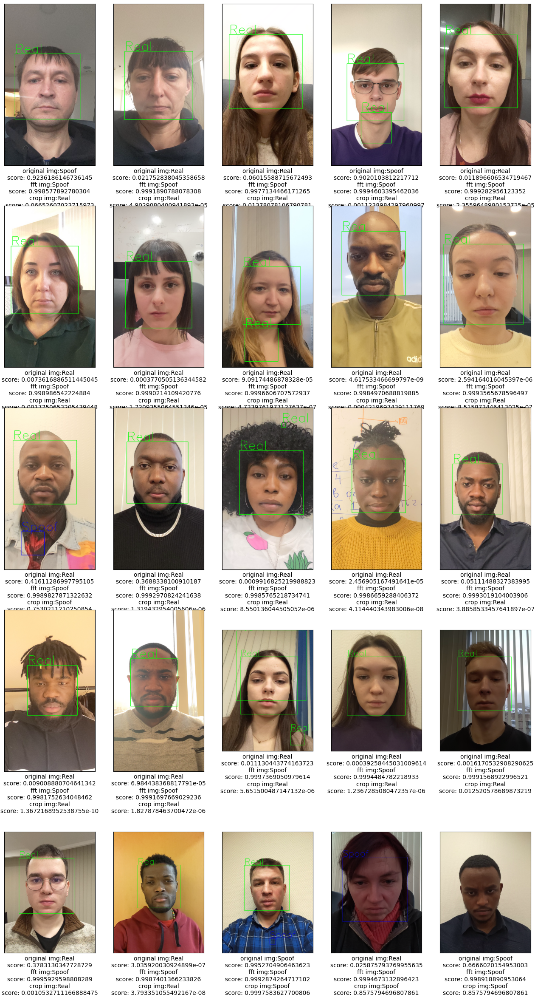

In [ ]:
# Create a figure to display images
pic_box = plt.figure(figsize=(16, 36))
new_path = f'{wdir}/users'

# Iterate through users and extract frames
for i, user in enumerate(sorted(os.listdir(new_path))):
    cap = cv2.VideoCapture(os.path.join(new_path, user))
    is_read, frame = cap.read()
    if is_read:
        picture = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        prediction_original = validate_prediction(predict_spoof(picture))
        label_original = 'Real' if prediction_original < 0.5 else 'Spoof'

        prediction_fft = validate_prediction(predict_spoof(compute_fourier_transform(picture)))
        label_fft = 'Real' if prediction_fft < 0.5 else 'Spoof'

        # Detect faces in the frame
        faces = detect_faces(picture)

        # Predict if each face is real or spoof
        for (x, y, w, h) in faces:
            face = picture[y:y+h, x:x+w]
            prediction = validate_prediction(predict_spoof(face))
            label = 'Real' if prediction < 0.5 else 'Spoof'

            # Draw bounding box and label on the image
            color = (0, 255, 0) if label == 'Real' else (0, 0, 255)
            cv2.rectangle(picture, (x, y), (x+w, y+h), color, 3)
            cv2.putText(picture, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 5, color, 3)

        # Add the image to the subplot
        pic_box.add_subplot(len(os.listdir(new_path))//5+1, 5, i+1)
        # plt.Text(f"label: {label}", fontsize=16)
        plt.imshow(picture)
        plt.xticks([])
        plt.yticks([])
        plt.xlabel(f'original img:{label_original}\nscore: {prediction_original}\nfft img:{label_fft}\nscore: {prediction_fft}\ncrop img:{label}\nscore: {prediction}')

        # Append results to the list
        prediction_results.append([user, 'real', 1-prediction_original, 1-prediction, 1-prediction_fft])

plt.show()


1/1 [==============================] - 0s 49ms/step


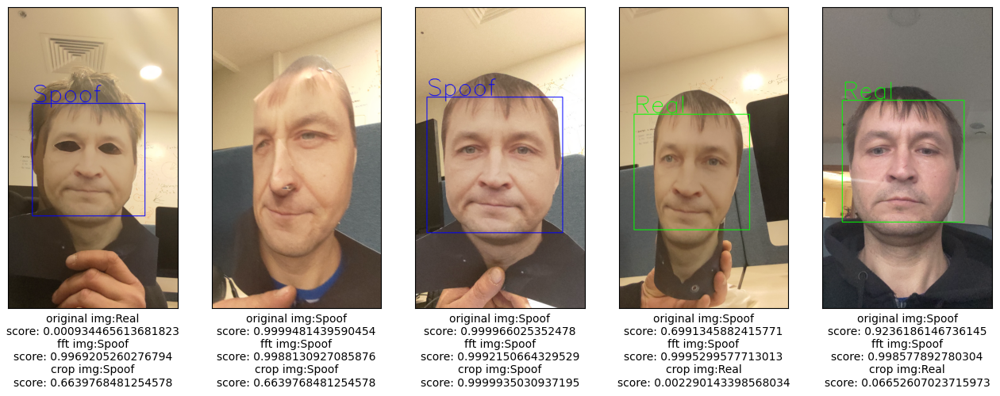

In [ ]:
# Create a figure to display images
pic_box = plt.figure(figsize=(16, 36))
new_path = f'{wdir}/exps'

# Iterate through users and extract frames
for i, user in enumerate(sorted(os.listdir(new_path))):
    cap = cv2.VideoCapture(os.path.join(new_path, user))
    is_read, frame = cap.read()
    if is_read:
        picture = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        prediction_original = validate_prediction(predict_spoof(picture))
        label_original = 'Real' if prediction_original < 0.5 else 'Spoof'

        prediction_fft = validate_prediction(predict_spoof(compute_fourier_transform(picture)))
        label_fft = 'Real' if prediction_fft < 0.5 else 'Spoof'

        # Detect faces in the frame
        faces = detect_faces(picture)

        # Predict if each face is real or spoof
        for (x, y, w, h) in faces:
            face = picture[y:y+h, x:x+w]
            prediction = validate_prediction(predict_spoof(face))
            label = 'Real' if prediction < 0.5 else 'Spoof'

            # Draw bounding box and label on the image
            color = (0, 255, 0) if label == 'Real' else (0, 0, 255)
            cv2.rectangle(picture, (x, y), (x+w, y+h), color, 3)
            cv2.putText(picture, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 5, color, 3)

        # Add the image to the subplot
        pic_box.add_subplot(len(os.listdir(new_path))//5+1, 5, i+1)
        # plt.Text(f"label: {label}", fontsize=16)
        plt.imshow(picture)
        plt.xticks([])
        plt.yticks([])
        plt.xlabel(f'original img:{label_original}\nscore: {prediction_original}\nfft img:{label_fft}\nscore: {prediction_fft}\ncrop img:{label}\nscore: {prediction}')

        # Append results to the list
        prediction_results.append([user, 'spoof', 1-prediction_original, 1-prediction, 1-prediction_fft])

plt.show()


In [ ]:
# Save the predictions to a CSV file
df = pd.DataFrame(prediction_results, columns=['video_file', 'Ground Truth', 'liveness_score', 'liveness_score_crop', 'liveness_score_frequency'])
df.to_csv('predictions_deep.csv', index=False)

In [ ]:
# # Create a figure to display images
# pic_box = plt.figure(figsize=(16, 36))
# new_path = f'/content/liveness-detection-dataset/rose_p3/monitor/user035/andr'

# videos = os.listdir(new_path)
# # Iterate through users and extract frames
# for i, user in enumerate(sorted(videos[:5])):
#     cap = cv2.VideoCapture(os.path.join(new_path, user))
#     is_read, frame = cap.read()
#     if is_read:
#         picture = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

#         prediction_original = predict_spoof(picture)
#         label_original = 'Real' if prediction_original < 0.5 else 'Spoof'

#         prediction_fft = predict_spoof(compute_fourier_transform(picture))
#         label_fft = 'Real' if prediction_fft < 0.5 else 'Spoof'

#         # Detect faces in the frame
#         faces = detect_faces(picture)

#         # Predict if each face is real or spoof
#         for (x, y, w, h) in faces:
#             face = picture[y:y+h, x:x+w]
#             prediction = predict_spoof(face)
#             label = 'Real' if prediction < 0.5 else 'Spoof'

#             # Draw bounding box and label on the image
#             color = (0, 255, 0) if label == 'Real' else (0, 0, 255)
#             cv2.rectangle(picture, (x, y), (x+w, y+h), color, 3)
#             cv2.putText(picture, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 5, color, 3)

#         # Add the image to the subplot
#         pic_box.add_subplot(len(videos)//5+1, 5, i+1)
#         # plt.Text(f"label: {label}", fontsize=16)
#         plt.imshow(picture)
#         plt.xticks([])
#         plt.yticks([])
#         plt.xlabel(f'original img:{label_original}\nscore: {prediction_original}\nfft img:{label_fft}\nscore: {prediction_fft}\ncrop img:{label}\nscore: {prediction}')

# plt.show()


# Part B (Feature Engineering)

## Connecting to Kaggle and Google Drive



In [ ]:
!pip install kaggle -q

In [ ]:
!mkdir ~/.kaggle
!mv './kaggle.json' ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# Load the Drive helper and mount
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
CV_ROOT_DIRECTORY = '/content/drive/MyDrive/CV/Final Project'

## Importing Libaries

In [ ]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

In [ ]:
import os
import glob
import shutil
import zipfile
from tqdm import tqdm

import cv2
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np # linear algebra
import seaborn as sns
import joblib

import matplotlib.pyplot as plt
import matplotlib.image as mimg

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam

from skimage.feature import local_binary_pattern
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import GridSearchCV, train_test_split
from scipy import ndimage
from sklearn.cluster import KMeans
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from sklearn.metrics import precision_score, recall_score, accuracy_score

In [ ]:
IMAGE_SIZE = 224

## Utils

In [ ]:
def get_model_description(pipeline):
    description = []
    for name, step in pipeline.named_steps.items():
        description.append(f"Step: {name}")
        if hasattr(step, 'get_params'):
            description.append(f"Parameters: {step.get_params()}")
        description.append("\n")
    return "\n".join(description)


def save_model_and_results(pipeline, scores, main_dir):
    # Create the main directory if it doesn't exist
    if not os.path.exists(main_dir):
        os.makedirs(main_dir)

    # Count the existing run directories to determine the next run number
    existing_runs = [d for d in os.listdir(main_dir) if os.path.isdir(os.path.join(main_dir, d)) and d.startswith('run_')]
    run_number = len(existing_runs) + 1
    run_dir = os.path.join(main_dir, f'run_{run_number}')

    # Create the new run directory
    os.makedirs(run_dir)

    # Save the pipeline to the run directory
    model_file = os.path.join(run_dir, 'pipeline.joblib')
    joblib.dump(pipeline, model_file)

    # Get model description
    model_description = get_model_description(pipeline)

    # Save the results to a text file
    results_file = os.path.join(run_dir, 'result.txt')
    with open(results_file, 'w') as f:
        f.write("Model Description:\n")
        f.write(model_description)
        f.write("\nEvaluation Metrics:\n")
        for key, value in scores:
            f.write(f'{key}: {value}\n')

    print(f"Model and results saved in {run_dir}")


def load_model(pipeline_root, run_number):
    joblib_file = os.path.join(
        pipeline_root, 'runs', f'run_{run_number}', 'pipeline.joblib'
    )
    loaded_pipeline = joblib.load(joblib_file)
    return loaded_pipeline

## Downloading Dataset and visualize some of them

### Dataset 1 (LCC-FASD)

In [ ]:
# Download the dataset
!kaggle datasets download -d faber24/lcc-fasd

# Unzip the dataset
with zipfile.ZipFile('lcc-fasd.zip', 'r') as zip_ref:
    zip_ref.extractall('lcc-fasd')

Dataset URL: https://www.kaggle.com/datasets/faber24/lcc-fasd
License(s): unknown
lcc-fasd.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
# Configuring directories

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory
dataset_root = "./lcc-fasd"
input_dir = os.path.join(dataset_root,"LCC_FASD")
train_dir = os.path.join(input_dir, 'LCC_FASD_training')
val_dir = os.path.join(input_dir, 'LCC_FASD_development')
test_dir = os.path.join(input_dir, 'LCC_FASD_evaluation')

dataset_dir = [dir for dir in sorted(os.listdir(input_dir)) if os.path.isdir(os.path.join(input_dir, dir))]
label_name = [subdir for subdir in sorted(os.listdir(train_dir)) if os.path.isdir(os.path.join(train_dir, subdir))]

# Printing the directory informations
print(f"Main directories\t: {os.listdir(dataset_root)}")
print(f"Dataset sub-directories\t: {dataset_dir}")
print(f"Train set directory\t: {label_name}")

Main directories	: ['LCC_FASD']
Dataset sub-directories	: ['LCC_FASD_development', 'LCC_FASD_evaluation', 'LCC_FASD_training']
Train set directory	: ['real', 'spoof']


In [ ]:
dir_dict = {'train': train_dir, 'val': val_dir, 'test': test_dir}
case_count, img_disp, set_length  = {}, {}, {}

for key, val in dir_dict.items():
    case_count[key] = {}
    img_disp[key] = {}
    set_count = 0

    for label in label_name:
        label_list = list(sorted(glob.glob(os.path.join(val, label, "*.png"))))
        if len(label_list) == 0:
          continue

        case_count[key][label] = len(label_list)
        set_count += len(label_list)

        select_img_id = np.random.randint(len(label_list)-1)
        # print(select_img_id)
        img_disp[key][label] = label_list[select_img_id]

    set_length[key] = set_count

case_count_df = pd.DataFrame(case_count)
img_disp_df = pd.DataFrame(img_disp)
print(f"Dataset summary:\n\n{case_count_df}")

Dataset summary:

       train   val  test
real    1223   405   314
spoof   7076  2543  7266


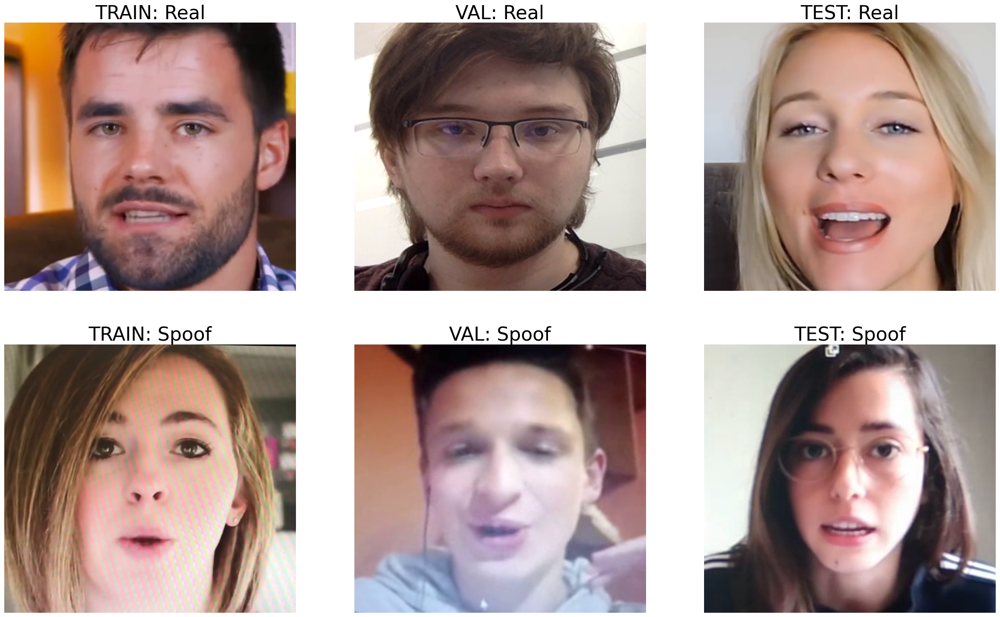

In [ ]:
# Visualizing some of the data set
num_classes = len(label_name)
num_dataset = 0
for key, val in set_length.items():
  num_dataset += 1 if val > 0 else 0

f, ax = plt.subplots(num_classes, num_dataset, figsize=(num_dataset*10, 18))

for k in range(num_classes*num_dataset):
    j, i = k//num_dataset, k%num_dataset  # Image indexing

    img = mimg.imread(img_disp_df.iloc[j, i])
    ax[j, i].imshow(img, cmap='gray')
    ax[j, i].set_title(f"{img_disp_df.columns[i].upper()}: {img_disp_df.index[j].capitalize()}", fontsize=32)
    ax[j, i].axis('off')
    ax[j, i].set_aspect('auto')

plt.show()

In [ ]:
def load_images_and_labels(dataset_path):
    images = []
    labels = []
    for label in ['real', 'spoof']:
        print(f"Loading {label} images...")
        label_path = os.path.join(dataset_path, label)
        for img_name in tqdm(os.listdir(label_path)):
            img_path = os.path.join(label_path, img_name)
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.resize(img, (224, 224))
                images.append(img)
                labels.append(1 if label == 'real' else 0)
    return np.array(images), np.array(labels)

In [ ]:
train_data = load_images_and_labels(train_dir)
val_data = load_images_and_labels(val_dir)
test_data = load_images_and_labels(test_dir)

Loading real images...


100%|██████████| 1223/1223 [00:15<00:00, 80.72it/s]


Loading spoof images...


100%|██████████| 7076/7076 [01:23<00:00, 84.73it/s]


Loading real images...


100%|██████████| 405/405 [00:05<00:00, 67.68it/s]


Loading spoof images...


100%|██████████| 2543/2543 [00:32<00:00, 77.19it/s]


Loading real images...


100%|██████████| 314/314 [00:04<00:00, 71.32it/s]


Loading spoof images...


100%|██████████| 7266/7266 [01:24<00:00, 85.52it/s]


### Dataset 2 (FASD)

In [ ]:
# Download the dataset
!kaggle datasets download -d minhnh2107/casiafasd

# Unzip the dataset
with zipfile.ZipFile('casiafasd.zip', 'r') as zip_ref:
    zip_ref.extractall('casiafasd')

Dataset URL: https://www.kaggle.com/datasets/minhnh2107/casiafasd
License(s): unknown
 81% 57.0M/70.6M [00:00<00:00, 99.6MB/s]
100% 70.6M/70.6M [00:00<00:00, 94.0MB/s]


In [ ]:
# Define the base directory where images are stored
train_dir = 'casiafasd/train_img/train_img/color'
test_dir = 'casiafasd/test_img/test_img/color'

In [ ]:
def load_images_and_labels(dataset_path):
    images = []
    labels = []

    for img_name in tqdm(os.listdir(dataset_path)):
        label = (1 if 'real' in img_name else 0)
        img_path = os.path.join(dataset_path, img_name)
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.resize(img, (224, 224))
            images.append(img)
            labels.append(label)
    return np.array(images), np.array(labels)

In [ ]:
train_data = load_images_and_labels(train_dir)
test_data = load_images_and_labels(test_dir)

100%|██████████| 2408/2408 [00:03<00:00, 623.19it/s]


## Feature Extractors

In [ ]:
class FaceDetector(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        faces = []
        print('Applying Face Detector...')
        for img in tqdm(X):
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            detected_faces = self.face_cascade.detectMultiScale(gray, 1.1, 4)
            if detected_faces is None or len(detected_faces) == 0:
                # Use a placeholder when no face is detected
                faces.append(cv2.resize(gray, (128, 128)))
            for (x, y, w, h) in detected_faces:
                faces.append(cv2.resize(gray[y:y+h, x:x+w], (128, 128)))
                break
        faces = np.array(faces)
        return faces

    def __getstate__(self):
        state = self.__dict__.copy()
        state['face_cascade'] = None  # Remove the unpickleable cv2.CascadeClassifier
        return state

    def __setstate__(self, state):
        self.__dict__.update(state)
        self.face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [ ]:
class MultiGridLBP(BaseEstimator, TransformerMixin):
    def __init__(self, grid_size, radius, n_points):
        self.grid_size = grid_size
        self.radius = radius
        self.n_points = n_points

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        print('Applying LBP...')
        lbp_features = []
        for img in tqdm(X):
            img = cv2.resize(img, (128, 128))
            if len(img.shape) == 3 and img.shape[2] == 3:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            h, w = img.shape
            grid_h, grid_w = h // self.grid_size, w // self.grid_size
            features = []
            for i in range(0, h, grid_h):
                for j in range(0, w, grid_w):
                    patch = img[i:i+grid_h, j:j+grid_w]
                    lbp = local_binary_pattern(patch, self.n_points, self.radius, method='uniform')
                    hist, _ = np.histogram(lbp, bins=np.arange(0, self.n_points + 3), range=(0, self.n_points + 2))
                    features.extend(hist)
            lbp_features.append(features)
        lbp_features = np.array(lbp_features)
        return lbp_features

In [ ]:
class GaborFeatureExtractor(BaseEstimator, TransformerMixin):
    def __init__(self, scales, thetas, sigmas, lambdas=[10.0], gammas=[0.5], psi=0, log='secondary'):
        self.scales = scales
        self.thetas = thetas
        self.sigmas = sigmas
        self.lambdas = lambdas
        self.gammas = gammas
        self.psi = psi
        self.features_count = len(scales) * len(thetas) * len(sigmas) * len(lambdas) * len(gammas) * 2
        self.log=log
        self.gabor_kernels = self._create_gabor_kernels()

    def _create_gabor_kernels(self):
        gabor_kernels = [
            cv2.getGaborKernel(
                (scale, scale), sigma, theta, lambd, gamma, self.psi, ktype=cv2.CV_32F
            ) for scale in self.scales
            for theta in self.thetas
            for sigma in self.sigmas
            for lambd in self.lambdas
            for gamma in self.gammas
        ]
        return gabor_kernels

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        print('Applying Gabor...')
        gabor_features = []
        for img in tqdm(X):
            img = cv2.resize(img, (128, 128))
            if len(img.shape) == 3 and img.shape[2] == 3:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = img.astype(np.float32)  # Ensure the image is float32
            if not np.any(img):
                gabor_features.append(np.zeros(self.features_count))
            else:
                features = []
                for kernel in self.gabor_kernels:
                    filtered = cv2.filter2D(img, cv2.CV_32F, kernel)
                    features.append(filtered.mean())
                    features.append(filtered.var())
                gabor_features.append(features)
        gabor_features = np.array(gabor_features)
        return gabor_features

In [ ]:
class HOGFeatureExtractor(BaseEstimator, TransformerMixin):
    def __init__(self, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), n_clusters=5):
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        self.n_clusters = n_clusters
        self.kmeans = KMeans(n_clusters=n_clusters)

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        print('Applying HOG...')
        hog_features = []
        for img in tqdm(X):
            img = cv2.resize(img, (128, 128))

            hog_descriptor = cv2.HOGDescriptor(
                _winSize=(img.shape[1] // self.pixels_per_cell[1] * self.pixels_per_cell[1],
                img.shape[0] // self.pixels_per_cell[0] * self.pixels_per_cell[0]),
                _blockSize=(self.cells_per_block[1] * self.pixels_per_cell[1],
                self.cells_per_block[0] * self.pixels_per_cell[0]),
                _blockStride=(self.pixels_per_cell[1], self.pixels_per_cell[0]),
                _cellSize=(self.pixels_per_cell[1], self.pixels_per_cell[0]),
                _nbins=self.orientations,
            )

            features = hog_descriptor.compute(img)

            # Cluster HOG features
            reshaped_features = features.reshape(-1, self.orientations)
            clustered_features = self.kmeans.fit_transform(reshaped_features)

            hog_features.append(clustered_features.flatten())
        return np.array(hog_features)

In [ ]:
class DOGFeatureExtractor(BaseEstimator, TransformerMixin):
    def __init__(self, sigma1=1, sigma2=2, num_scales=3):
        self.sigma1 = sigma1
        self.sigma2 = sigma2
        self.num_scales = num_scales

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        print('Applying DOG...')
        dog_features = []
        for img in tqdm(X):
            img = cv2.resize(img, (128, 128))
            multi_scale_dog = []
            for i in range(self.num_scales):
                scale_factor = 2 ** i
                g1 = ndimage.gaussian_filter(img, sigma=self.sigma1 * scale_factor)
                g2 = ndimage.gaussian_filter(img, sigma=self.sigma2 * scale_factor)
                dog = g1 - g2
                multi_scale_dog.append(dog)
            dog_features.append(np.concatenate([d.flatten() for d in multi_scale_dog]))
        return np.array(dog_features)

In [ ]:
class SIFTFeatureExtractor(BaseEstimator, TransformerMixin):
    def __init__(self, n_keypoints=100, contrast_threshold=0.04):
        self.n_keypoints = n_keypoints
        self.contrast_threshold = contrast_threshold
        self.sift = cv2.SIFT_create(nfeatures=self.n_keypoints, contrastThreshold=self.contrast_threshold)

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        print('Applying SIFT...')
        sift_features = []
        for img in tqdm(X):
            img = cv2.resize(img, (128, 128))
            keypoints, descriptors = self.sift.detectAndCompute(img, None)
            if descriptors is not None:
                if descriptors.shape[0] > self.n_keypoints:
                    descriptors = descriptors[:self.n_keypoints]
                elif descriptors.shape[0] < self.n_keypoints:
                    pad_width = self.n_keypoints - descriptors.shape[0]
                    descriptors = np.pad(descriptors, ((0, pad_width), (0, 0)), mode='constant')
            else:
                descriptors = np.zeros((self.n_keypoints, 128))
            sift_features.append(descriptors.flatten())
        return np.array(sift_features)

    def __getstate__(self):
        state = self.__dict__.copy()
        state['sift'] = None  # Remove the unpickleable cv2.SIFT object
        return state

    def __setstate__(self, state):
        self.__dict__.update(state)
        self.sift = cv2.SIFT_create(nfeatures=self.n_keypoints, contrastThreshold=self.contrast_threshold)

In [ ]:
class FFTFeatureExtractor(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        fft_features = []
        print('Applying FFT...')
        for img in tqdm(X):
            # Ensure the image is grayscale
            if len(img.shape) == 3 and img.shape[2] == 3:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            # Resize the image to a fixed size (e.g., 128x128)
            img = cv2.resize(img, (128, 128))
            # Compute the FFT
            f = np.fft.fft2(img)
            fshift = np.fft.fftshift(f)
            eps = 1e-10  # Small constant to avoid zero or negative values
            magnitude_spectrum = 20 * np.log(np.abs(fshift) + eps)
            # Flatten the magnitude spectrum and select the top n_components frequencies
            features = magnitude_spectrum.flatten()
            fft_features.append(features)
        return np.array(fft_features)

In [ ]:
# Create pipelines for each feature extraction process

lbp_pipeline = Pipeline([
    ('face_detector', FaceDetector()),
    ('lbp', MultiGridLBP(grid_size=8, radius=1, n_points=8)),
    ('pca', PCA(n_components=30)),
    ('scaler', StandardScaler()),
])

gabor_pipeline = Pipeline([
    ('face_detector', FaceDetector()),
    ('gabor', GaborFeatureExtractor(
        scales=[5, 9, 13, 17],
        thetas=np.arange(0, np.pi, np.pi / 8),
        sigmas=[20, 40, 60],
        # gammas=[0.25, 0.5, 0.75],
    )),
    ('pca', PCA(n_components=30)),
    ('scaler', StandardScaler()),
])

# Assuming the main image processing with fewer grids, scales, thetas, and sigmas
gabor_full_image_pipeline = Pipeline([
    ('gabor', GaborFeatureExtractor(
        scales=[7, 19, 31],
        thetas=np.arange(0, np.pi, np.pi / 4),
        sigmas=[20, 60],
        log='main_pipeline',
    )),
    ('pca', PCA(n_components=30)),
    ('scaler', StandardScaler()),
])

hog_pipeline = Pipeline([
    ('hog', HOGFeatureExtractor()),
    ('pca', PCA(n_components=50)),
    ('scaler', StandardScaler()),
])

dog_pipeline = Pipeline([
    ('dog', DOGFeatureExtractor()),
    ('pca', PCA(n_components=50)),
    ('scaler', StandardScaler()),
])

sift_pipeline = Pipeline([
    ('sift', SIFTFeatureExtractor()),
    ('pca', PCA(n_components=50)),
    ('scaler', StandardScaler()),
])

fft_pipeline = Pipeline([
    ('fft', FFTFeatureExtractor()),
    ('pca', PCA(n_components=20)),
    ('scaler', StandardScaler()),
])

## Defining Pipelines and Initial Training

In [ ]:
# # Combine all features
# combined_features = FeatureUnion([
#     ('lbp_pipeline', lbp_pipeline),
#     ('gabor_pipeline', gabor_pipeline),
#     # ('gabor_full_image_pipeline', gabor_full_image_pipeline)
#     # ('hog_pipeline', hog_pipeline),
#     # ('dog_pipeline', dog_pipeline),
#     # ('sift_pipeline', sift_pipeline),
#     # ('ycbcr_pipeline', ycbcr_pipeline),
#     # ('luv_pipeline', luv_pipeline),
# ])

# # Final pipeline with classifier
# final_pipeline = ImbPipeline([
#     ('features', combined_features),
#     # ('pca', PCA(n_components=50)),
#     # ('scaler', StandardScaler()),
#     ('smote', SMOTE()),
#     ('svm', SVC(kernel='rbf'))
# ])

In [ ]:
# from sklearn.model_selection import KFold, cross_val_score
# from sklearn.svm import SVC
# from sklearn.preprocessing import StandardScaler
# import numpy as np

# # Assume X and y are your features and target variable
# X_train = train_data[0]
# y_train = train_data[1]

# # Normalize features
# # scaler = StandardScaler()
# # X_scaled = X_train/256

# # Set up K-Fold cross-validation
# k = 5  # Number of folds
# kf = KFold(n_splits=k, shuffle=True, random_state=42)

# # Perform K-Fold cross-validation
# cv_scores = cross_val_score(final_pipeline, X_train, y_train, cv=kf, scoring='accuracy')

# # Print results
# print(f"Cross-validation scores: {cv_scores}")
# print(f"Mean CV score: {np.mean(cv_scores):.4f}")
# print(f"Standard deviation of CV score: {np.std(cv_scores):.4f}")

In [ ]:
# # Assume X and y are your features and target variable
# X_train = train_data[0]
# y_train = train_data[1]

# final_pipeline.fit(X_train, y_train)

In [ ]:
# # Predict on the test data
# y_pred = final_pipeline.predict(test_data[0])

# # Calculate precision and recall
# precision = precision_score(test_data[1], y_pred, average='binary')  # use 'micro', 'macro', 'weighted' for multiclass
# recall = recall_score(test_data[1], y_pred, average='binary')        # use 'micro', 'macro', 'weighted' for multiclass
# accuracy = accuracy_score(test_data[1], y_pred)        # use 'micro', 'macro', 'weighted' for multiclass

# precision, recall, accuracy

In [ ]:
# save_model_and_results(final_pipeline,
#   [
#       ('Precision', precision),
#       ('Recall', recall),
#       ('Accuracy', accuracy)
#   ], os.path.join(CV_ROOT_DIRECTORY, 'runs'))

In [ ]:
# loaded_pipeline = load_model(CV_ROOT_DIRECTORY, 1)

In [ ]:
# # Predict on the test data
# y_pred = loaded_pipeline.predict(test_data[0])

# # Calculate precision and recall
# precision = precision_score(test_data[1], y_pred, average='binary')  # use 'micro', 'macro', 'weighted' for multiclass
# recall = recall_score(test_data[1], y_pred, average='binary')        # use 'micro', 'macro', 'weighted' for multiclass
# accuracy = accuracy_score(test_data[1], y_pred)        # use 'micro', 'macro', 'weighted' for multiclass

# precision, recall, accuracy

## Testing Combinations of features

### Testing each feature individually

#### LBP

In [ ]:
# Combine all features
combined_features = FeatureUnion([
    ('lbp_pipeline', lbp_pipeline),
    # ('gabor_pipeline', gabor_pipeline),
    # ('gabor_full_image_pipeline', gabor_full_image_pipeline)
    # ('hog_pipeline', hog_pipeline),
    # ('dog_pipeline', dog_pipeline),
    # ('sift_pipeline', sift_pipeline),
])

# Final pipeline with classifier
final_pipeline = ImbPipeline([
    ('features', combined_features),
    # ('pca', PCA(n_components=50)),
    # ('scaler', StandardScaler()),
    ('smote', SMOTE()),
    ('svm', SVC(kernel='rbf'))
])

X_train = train_data[0]
X_test = test_data[0]
y_train = train_data[1]
y_test = test_data[1]

# Train the pipeline
final_pipeline.fit(X_train, y_train)

# Evaluate on test set
predictions = final_pipeline.predict(X_test)

precision = precision_score(y_test, predictions, average='binary')
recall = recall_score(y_test, predictions, average='binary')
accuracy = accuracy_score(y_test, predictions)

print("Precision:", precision)
print("Recall:", recall)
print("Accuracy:", accuracy)

Applying Face Detector...


100%|██████████| 1655/1655 [01:14<00:00, 22.29it/s]


Applying LBP...


100%|██████████| 1655/1655 [00:19<00:00, 84.00it/s]


Applying Face Detector...


100%|██████████| 2408/2408 [01:27<00:00, 27.66it/s]


Applying LBP...


100%|██████████| 2408/2408 [00:29<00:00, 82.26it/s]


Precision: 0.2657894736842105
Recall: 0.34179357021996615
Accuracy: 0.6067275747508306


#### Gabor

In [ ]:
# Combine all features
combined_features = FeatureUnion([
    # ('lbp_pipeline', lbp_pipeline),
    ('gabor_pipeline', gabor_pipeline),
    # ('gabor_full_image_pipeline', gabor_full_image_pipeline)
    # ('hog_pipeline', hog_pipeline),
    # ('dog_pipeline', dog_pipeline),
    # ('sift_pipeline', sift_pipeline),
])

# Final pipeline with classifier
final_pipeline = ImbPipeline([
    ('features', combined_features),
    # ('pca', PCA(n_components=50)),
    # ('scaler', StandardScaler()),
    ('smote', SMOTE()),
    ('svm', SVC(kernel='rbf'))
])

X_train = train_data[0]
X_test = test_data[0]
y_train = train_data[1]
y_test = test_data[1]

# Train the pipeline
final_pipeline.fit(X_train, y_train)

# Evaluate on test set
predictions = final_pipeline.predict(X_test)

precision = precision_score(y_test, predictions, average='binary')
recall = recall_score(y_test, predictions, average='binary')
accuracy = accuracy_score(y_test, predictions)

print("Precision:", precision)
print("Recall:", recall)
print("Accuracy:", accuracy)

Applying Face Detector...


100%|██████████| 1655/1655 [01:32<00:00, 17.80it/s]


Applying Gabor...


100%|██████████| 1655/1655 [01:07<00:00, 24.66it/s]


Applying Face Detector...


100%|██████████| 2408/2408 [01:21<00:00, 29.61it/s]


Applying Gabor...


100%|██████████| 2408/2408 [01:38<00:00, 24.44it/s]


Precision: 0.1869009584664537
Recall: 0.19796954314720813
Accuracy: 0.5917774086378738


#### Gabor Full Image

In [ ]:
# Combine all features
combined_features = FeatureUnion([
    # ('lbp_pipeline', lbp_pipeline),
    # ('gabor_pipeline', gabor_pipeline),
    ('gabor_full_image_pipeline', gabor_full_image_pipeline)
    # ('hog_pipeline', hog_pipeline),
    # ('dog_pipeline', dog_pipeline),
    # ('sift_pipeline', sift_pipeline),
])

# Final pipeline with classifier
final_pipeline = ImbPipeline([
    ('features', combined_features),
    # ('pca', PCA(n_components=50)),
    # ('scaler', StandardScaler()),
    ('smote', SMOTE()),
    ('svm', SVC(kernel='rbf'))
])

X_train = train_data[0]
X_test = test_data[0]
y_train = train_data[1]
y_test = test_data[1]

# Train the pipeline
final_pipeline.fit(X_train, y_train)

# Evaluate on test set
predictions = final_pipeline.predict(X_test)

precision = precision_score(y_test, predictions, average='binary')
recall = recall_score(y_test, predictions, average='binary')
accuracy = accuracy_score(y_test, predictions)

print("Precision:", precision)
print("Recall:", recall)
print("Accuracy:", accuracy)

Applying Gabor...


100%|██████████| 1655/1655 [00:21<00:00, 77.88it/s]


Applying Gabor...


100%|██████████| 2408/2408 [00:33<00:00, 72.78it/s]


Precision: 0.2572992700729927
Recall: 0.23857868020304568
Accuracy: 0.6441029900332226


#### HOG

In [ ]:
# Combine all features
combined_features = FeatureUnion([
    # ('lbp_pipeline', lbp_pipeline),
    # ('gabor_pipeline', gabor_pipeline),
    # ('gabor_full_image_pipeline', gabor_full_image_pipeline)
    ('hog_pipeline', hog_pipeline),
    # ('dog_pipeline', dog_pipeline),
    # ('sift_pipeline', sift_pipeline),
])

# Final pipeline with classifier
final_pipeline = ImbPipeline([
    ('features', combined_features),
    # ('pca', PCA(n_components=50)),
    # ('scaler', StandardScaler()),
    ('smote', SMOTE()),
    ('svm', SVC(kernel='rbf'))
])

X_train = train_data[0]
X_test = test_data[0]
y_train = train_data[1]
y_test = test_data[1]

# Train the pipeline
final_pipeline.fit(X_train, y_train)

# Evaluate on test set
predictions = final_pipeline.predict(X_test)

precision = precision_score(y_test, predictions, average='binary')
recall = recall_score(y_test, predictions, average='binary')
accuracy = accuracy_score(y_test, predictions)

print("Precision:", precision)
print("Recall:", recall)
print("Accuracy:", accuracy)

Applying HOG...


100%|██████████| 1655/1655 [01:55<00:00, 14.32it/s]


Applying HOG...


100%|██████████| 2408/2408 [02:18<00:00, 17.43it/s]


Precision: 0.20935412026726058
Recall: 0.31810490693739424
Accuracy: 0.5377906976744186


#### DOG

In [ ]:
# Combine all features
combined_features = FeatureUnion([
    # ('lbp_pipeline', lbp_pipeline),
    # ('gabor_pipeline', gabor_pipeline),
    # ('gabor_full_image_pipeline', gabor_full_image_pipeline)
    # ('hog_pipeline', hog_pipeline),
    ('dog_pipeline', dog_pipeline),
    # ('sift_pipeline', sift_pipeline),
])

# Final pipeline with classifier
final_pipeline = ImbPipeline([
    ('features', combined_features),
    # ('pca', PCA(n_components=50)),
    # ('scaler', StandardScaler()),
    ('smote', SMOTE()),
    ('svm', SVC(kernel='rbf'))
])

X_train = train_data[0]
X_test = test_data[0]
y_train = train_data[1]
y_test = test_data[1]

# Train the pipeline
final_pipeline.fit(X_train, y_train)

# Evaluate on test set
predictions = final_pipeline.predict(X_test)

precision = precision_score(y_test, predictions, average='binary')
recall = recall_score(y_test, predictions, average='binary')
accuracy = accuracy_score(y_test, predictions)

print("Precision:", precision)
print("Recall:", recall)
print("Accuracy:", accuracy)

Applying DOG...


100%|██████████| 1655/1655 [00:41<00:00, 39.79it/s]


Applying DOG...


100%|██████████| 2408/2408 [00:58<00:00, 40.88it/s]


Precision: 0.26641137855579866
Recall: 0.8240270727580372
Accuracy: 0.3999169435215947


#### SIFT

In [ ]:
# Combine all features
combined_features = FeatureUnion([
    # ('lbp_pipeline', lbp_pipeline),
    # ('gabor_pipeline', gabor_pipeline),
    # ('gabor_full_image_pipeline', gabor_full_image_pipeline)
    # ('hog_pipeline', hog_pipeline),
    # ('dog_pipeline', dog_pipeline),
    ('sift_pipeline', sift_pipeline),
])

# Final pipeline with classifier
final_pipeline = ImbPipeline([
    ('features', combined_features),
    # ('pca', PCA(n_components=50)),
    # ('scaler', StandardScaler()),
    ('smote', SMOTE()),
    ('svm', SVC(kernel='rbf'))
])

X_train = train_data[0]
X_test = test_data[0]
y_train = train_data[1]
y_test = test_data[1]

# Train the pipeline
final_pipeline.fit(X_train, y_train)

# Evaluate on test set
predictions = final_pipeline.predict(X_test)

precision = precision_score(y_test, predictions, average='binary')
recall = recall_score(y_test, predictions, average='binary')
accuracy = accuracy_score(y_test, predictions)

print("Precision:", precision)
print("Recall:", recall)
print("Accuracy:", accuracy)

Applying SIFT...


100%|██████████| 1655/1655 [00:16<00:00, 97.97it/s] 


Applying SIFT...


100%|██████████| 2408/2408 [00:21<00:00, 113.12it/s]


Precision: 0.264750378214826
Recall: 0.8883248730964467
Accuracy: 0.36710963455149503


### Test 2 to 4 combinations

In [ ]:
import itertools

features = [
    ('lbp_pipeline', lbp_pipeline),
    ('gabor_pipeline', gabor_pipeline),
    ('gabor_full_image_pipeline', gabor_full_image_pipeline),
    ('hog_pipeline', hog_pipeline),
    ('dog_pipeline', dog_pipeline),
    ('sift_pipeline', sift_pipeline),
]

# Generate all unique combinations (excluding individual pipelines)
all_combinations = []
for r in range(1, 4):
    all_combinations.extend(list(itertools.combinations(features, r)))

In [ ]:
# Selecting combinations
all_combinations = all_combinations[6:7]

In [ ]:
def test_pipeline_combination(combination, X_train, X_test, y_train, y_test):
    pipeline = Pipeline([
        ('features', FeatureUnion([
            (name, pipeline)
            for name, pipeline in combination
        ])),
        ('svm', SVC(kernel='rbf'))
    ])

    # Train the pipeline
    pipeline.fit(X_train, y_train)

    # Evaluate on test set
    predictions = pipeline.predict(X_test)

    precision = precision_score(y_test, predictions, average='binary')
    recall = recall_score(y_test, predictions, average='binary')
    accuracy = accuracy_score(y_test, predictions)

    return precision, recall, accuracy

In [ ]:
# Function to get the name of a combination
def get_combo_name(combo):
    return " + ".join(pipeline[0] for pipeline in combo)

In [ ]:
results = {}

X_train = train_data[0]
X_test = test_data[0]
y_train = train_data[1]
y_test = test_data[1]

for combo in all_combinations:
    combo_name = get_combo_name(combo)
    print("\nTesting combination", combo_name)
    scores = test_pipeline_combination(combo, X_train, X_test, y_train, y_test)
    results[combo_name] = scores

    print("Precision:", scores[0])
    print("Recall:", scores[1])
    print("Accuracy:", scores[2])


Testing combination lbp_pipeline + gabor_pipeline
Applying Face Detector...


100%|██████████| 1655/1655 [00:56<00:00, 29.27it/s]


Applying LBP...


100%|██████████| 1655/1655 [00:20<00:00, 80.12it/s]


Applying Face Detector...


100%|██████████| 1655/1655 [00:54<00:00, 30.13it/s]


Applying Gabor...


100%|██████████| 1655/1655 [01:07<00:00, 24.61it/s]


Applying Face Detector...


100%|██████████| 2408/2408 [01:19<00:00, 30.34it/s]


Applying LBP...


100%|██████████| 2408/2408 [00:28<00:00, 83.06it/s]


Applying Face Detector...


100%|██████████| 2408/2408 [01:21<00:00, 29.65it/s]


Applying Gabor...


100%|██████████| 2408/2408 [01:34<00:00, 25.44it/s]


Precision: 0.6898608349900597
Recall: 0.5871404399323181
Accuracy: 0.8338870431893688


In [ ]:
best_combination = max(results.items(), key=lambda x: sum(x[1]) / len(x[1]))
best_score = results[best_combination[0]]

print("Best combination:", best_combination)
print("Best average score:", best_score)

Best combination: ('lbp_pipeline + gabor_pipeline', (0.6898608349900597, 0.5871404399323181, 0.8338870431893688))
Best average score: (0.6898608349900597, 0.5871404399323181, 0.8338870431893688)


In [ ]:
data = []
for combo_name, scores in results.items():
    data.append({
        'Combination': combo_name,
        'Precision': scores[0],
        'Recall': scores[1],
        'Accuracy': scores[2]
    })

# Create the DataFrame
df = pd.DataFrame(data)

# Set the 'Model' column as the index
df.set_index('Combination', inplace=True)

df.to_csv('results.csv')

In [ ]:
# Directory where your CSV files are located
directory = 'results'

# Initialize an empty list to store DataFrames
dfs = []

filenames = [f'results_{i}.csv' for i in range(1, len(os.listdir(directory)))]

# Loop through all files in the directory
for filename in filenames:
    # Read the CSV file into a DataFrame
    filepath = os.path.join(directory, filename)
    df = pd.read_csv(filepath)
    # Append the DataFrame to the list
    dfs.append(df)

# Concatenate all DataFrames in the list
combined_df = pd.concat(dfs, ignore_index=True)

score_columns = ['Precision', 'Recall', 'Accuracy']

# Calculate the average of the score columns for each row and add it as a new column
combined_df['average_score'] = combined_df[score_columns].mean(axis=1)

# Rank each model based on the average score (ascending order by default)
combined_df['rank'] = combined_df['average_score'].rank(method='min', ascending=False)

# Sort the DataFrame by rank
sorted_combined_df = combined_df.sort_values(by='rank').reset_index(drop=True)

# Save the combined DataFrame to a new CSV file
sorted_combined_df.to_csv(os.path.join(directory, 'results.csv'), index=False)

print("CSV files combined successfully.")

sorted_combined_df

CSV files combined successfully.


,Combination,Precision,Recall,Accuracy,average_score,rank
0,lbp_pipeline + gabor_pipeline + dog_pipeline +...,0.875000,0.758037,0.914037,0.849025,1.0
1,lbp_pipeline + gabor_pipeline + hog_pipeline +...,0.834646,0.717428,0.895764,0.815946,2.0
2,lbp_pipeline + gabor_pipeline + dog_pipeline,0.838323,0.710660,0.895349,0.814777,3.0
3,lbp_pipeline + gabor_full_image_pipeline + dog...,0.823301,0.717428,0.892857,0.811195,4.0
4,lbp_pipeline + gabor_full_image_pipeline + dog...,0.796262,0.720812,0.886213,0.801095,5.0
5,lbp_pipeline + gabor_full_image_pipeline + hog...,0.800774,0.700508,0.883721,0.795001,6.0
6,lbp_pipeline + gabor_pipeline + hog_pipeline +...,0.795802,0.705584,0.883306,0.794897,7.0
7,lbp_pipeline + dog_pipeline,0.834409,0.656514,0.883721,0.791548,8.0
8,lbp_pipeline + gabor_pipeline + gabor_full_ima...,0.808333,0.656514,0.877492,0.780780,9.0
9,gabor_pipeline + gabor_full_image_pipeline + d...,0.823144,0.637902,0.877492,0.779513,10.0


### Search for best parameters

In [ ]:
# Define the parameter grid
param_grid = {
    'svm__C': [0.1, 1, 10, 100],
    'svm__gamma': [1, 0.1, 0.01, 0.001],
    'svm__kernel': ['linear', 'rbf', 'poly', 'sigmoid']
}

# Set up GridSearchCV
grid_search = GridSearchCV(final_pipeline, param_grid, cv=5, scoring='accuracy', verbose=2, n_jobs=1)

# Fit the model
grid_search.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation score: ", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
test_score = best_model.score(X_test, y_test)
print("Test set score: ", test_score)

## Training and Testing Final Models

### 1st model

In [ ]:
# Combine all features
combined_features = FeatureUnion([
    ('lbp_pipeline', lbp_pipeline),
    ('gabor_pipeline', gabor_pipeline),
    ('dog_pipeline', dog_pipeline),
    ('sift_pipeline', sift_pipeline),
])

# Final pipeline with classifier
final_pipeline = ImbPipeline([
    ('features', combined_features),
    # ('pca', PCA(n_components=50)),
    # ('scaler', StandardScaler()),
    ('smote', SMOTE()),
    ('svm', SVC(kernel='rbf', probability=True))
])

In [ ]:
# Assume X and y are your features and target variable
X_train = train_data[0]
y_train = train_data[1]

# Combine X_train and y_train to shuffle them together
combined_data = list(zip(X_train, y_train))

# Shuffle the combined data
np.random.shuffle(combined_data)

# Split the combined data back into X_train and y_train
X_train_shuffled, y_train_shuffled = zip(*combined_data)

# Convert back to arrays if needed
X_train_shuffled = np.array(X_train_shuffled)
y_train_shuffled = np.array(y_train_shuffled)

final_pipeline.fit(X_train_shuffled, y_train_shuffled)

Applying Face Detector...


100%|██████████| 1655/1655 [00:54<00:00, 30.52it/s]


Applying LBP...


100%|██████████| 1655/1655 [00:20<00:00, 82.74it/s]


Applying Face Detector...


100%|██████████| 1655/1655 [00:54<00:00, 30.31it/s]


Applying Gabor...


100%|██████████| 1655/1655 [00:57<00:00, 28.75it/s]


Applying DOG...


100%|██████████| 1655/1655 [00:38<00:00, 42.79it/s]


Applying SIFT...


100%|██████████| 1655/1655 [00:11<00:00, 138.19it/s]


Pipeline(steps=[('features',
                 FeatureUnion(transformer_list=[('lbp_pipeline',
                                                 Pipeline(steps=[('face_detector',
                                                                  FaceDetector()),
                                                                 ('lbp',
                                                                  MultiGridLBP(grid_size=8,
                                                                               n_points=8,
                                                                               radius=1)),
                                                                 ('pca',
                                                                  PCA(n_components=30)),
                                                                 ('scaler',
                                                                  StandardScaler())])),
                                                ('gabor_pipeline',
                                                 Pipeline(steps=[('face_detector',
                                                                  FaceDetector()),
                                                                 ('gabor',
                                                                  GaborFeatureExtractor(scales=[5,
                                                                                                9,
                                                                                                13...
                                                                  PCA(n_components=30)),
                                                                 ('scaler',
                                                                  StandardScaler())])),
                                                ('dog_pipeline',
                                                 Pipeline(steps=[('dog',
                                                                  DOGFeatureExtractor()),
                                                                 ('pca',
                                                                  PCA(n_components=50)),
                                                                 ('scaler',
                                                                  StandardScaler())])),
                                                ('sift_pipeline',
                                                 Pipeline(steps=[('sift',
                                                                  SIFTFeatureExtractor()),
                                                                 ('pca',
                                                                  PCA(n_components=50)),
                                                                 ('scaler',
                                                                  StandardScaler())]))])),
                ('smote', SMOTE()), ('svm', SVC(probability=True))])

In [ ]:
# Assume X and y are your features and target variable
X_test = test_data[0]
y_test = test_data[1]

# Combine X_train and y_train to shuffle them together
combined_data = list(zip(X_test, y_test))

# Shuffle the combined data
np.random.shuffle(combined_data)

# Split the combined data back into X_train and y_train
X_test_shuffled, y_test_shuffled = zip(*combined_data)

# Convert back to arrays if needed
X_test_shuffled = np.array(X_test_shuffled)
y_test_shuffled = np.array(y_test_shuffled)

y_pred = final_pipeline.predict(X_test_shuffled)

# Calculate precision and recall
precision = precision_score(y_test_shuffled, y_pred, average='binary')  # use 'micro', 'macro', 'weighted' for multiclass
recall = recall_score(y_test_shuffled, y_pred, average='binary')        # use 'micro', 'macro', 'weighted' for multiclass
accuracy = accuracy_score(y_test_shuffled, y_pred)        # use 'micro', 'macro', 'weighted' for multiclass

precision, recall, accuracy

Applying Face Detector...


100%|██████████| 2408/2408 [01:16<00:00, 31.40it/s]


Applying LBP...


100%|██████████| 2408/2408 [00:27<00:00, 87.02it/s]


Applying Face Detector...


100%|██████████| 2408/2408 [01:18<00:00, 30.68it/s]


Applying Gabor...


100%|██████████| 2408/2408 [01:20<00:00, 29.73it/s]


Applying DOG...


100%|██████████| 2408/2408 [00:55<00:00, 43.05it/s]


Applying SIFT...


100%|██████████| 2408/2408 [00:17<00:00, 137.06it/s]


(0.8345724907063197, 0.7597292724196277, 0.9040697674418605)

In [ ]:
save_model_and_results(
    final_pipeline,
    [
        ('Precision', precision),
        ('Recall', recall),
        ('Accuracy', accuracy)
    ],
    os.path.join(CV_ROOT_DIRECTORY, 'runs')
)

Model and results saved in /content/drive/MyDrive/CV/Final Project/runs/run_5


### 2nd Model

In [ ]:
# Combine all features
combined_features = FeatureUnion([
    ('lbp_pipeline', lbp_pipeline),
    ('gabor_pipeline', gabor_pipeline),
    ('dog_pipeline', dog_pipeline),
])

# Final pipeline with classifier
final_pipeline = ImbPipeline([
    ('features', combined_features),
    # ('pca', PCA(n_components=50)),
    # ('scaler', StandardScaler()),
    ('smote', SMOTE()),
    ('svm', SVC(kernel='rbf'))
])

In [ ]:
# Assume X and y are your features and target variable
X_train = train_data[0]
y_train = train_data[1]

final_pipeline.fit(X_train, y_train)

Applying Face Detector...


100%|██████████| 1655/1655 [01:04<00:00, 25.68it/s]


Applying LBP...


100%|██████████| 1655/1655 [00:20<00:00, 78.89it/s]


Applying Face Detector...


100%|██████████| 1655/1655 [01:00<00:00, 27.52it/s]


Applying Gabor...


100%|██████████| 1655/1655 [01:06<00:00, 24.86it/s]


Applying DOG...


100%|██████████| 1655/1655 [00:40<00:00, 40.49it/s]


Pipeline(steps=[('features',
                 FeatureUnion(transformer_list=[('lbp_pipeline',
                                                 Pipeline(steps=[('face_detector',
                                                                  FaceDetector()),
                                                                 ('lbp',
                                                                  MultiGridLBP(grid_size=8,
                                                                               n_points=8,
                                                                               radius=1)),
                                                                 ('pca',
                                                                  PCA(n_components=30)),
                                                                 ('scaler',
                                                                  StandardScaler())])),
                                                ('gabor_pipeline',
                                                 Pipeline(steps=[('face_detector',
                                                                  FaceDetector()),
                                                                 ('gabor',
                                                                  GaborFeatureExtractor(scales=[5,
                                                                                                9,
                                                                                                13,
                                                                                                17],
                                                                                        sigmas=[20,
                                                                                                40,
                                                                                                60],
                                                                                        thetas=array([0.        , 0.39269908, 0.78539816, 1.17809725, 1.57079633,
       1.96349541, 2.35619449, 2.74889357]))),
                                                                 ('pca',
                                                                  PCA(n_components=30)),
                                                                 ('scaler',
                                                                  StandardScaler())])),
                                                ('dog_pipeline',
                                                 Pipeline(steps=[('dog',
                                                                  DOGFeatureExtractor()),
                                                                 ('pca',
                                                                  PCA(n_components=50)),
                                                                 ('scaler',
                                                                  StandardScaler())]))])),
                ('smote', SMOTE()), ('svm', SVC())])

In [ ]:
# Predict on the test data
y_pred = final_pipeline.predict(test_data[0])

# Calculate precision and recall
precision = precision_score(test_data[1], y_pred, average='binary')  # use 'micro', 'macro', 'weighted' for multiclass
recall = recall_score(test_data[1], y_pred, average='binary')        # use 'micro', 'macro', 'weighted' for multiclass
accuracy = accuracy_score(test_data[1], y_pred)        # use 'micro', 'macro', 'weighted' for multiclass

precision, recall, accuracy

Applying Face Detector...


100%|██████████| 2408/2408 [01:24<00:00, 28.49it/s]


Applying LBP...


100%|██████████| 2408/2408 [00:28<00:00, 83.88it/s]


Applying Face Detector...


100%|██████████| 2408/2408 [01:21<00:00, 29.54it/s]


Applying Gabor...


100%|██████████| 2408/2408 [01:35<00:00, 25.19it/s]


Applying DOG...


100%|██████████| 2408/2408 [00:59<00:00, 40.60it/s]


(0.8277153558052435, 0.7478849407783418, 0.8999169435215947)

In [ ]:
save_model_and_results(
    final_pipeline,
    [
        ('Precision', precision),
        ('Recall', recall),
        ('Accuracy', accuracy)
    ],
    os.path.join(CV_ROOT_DIRECTORY, 'runs')
)

Model and results saved in /content/drive/MyDrive/CV/Final Project/runs/run_3


## Feature Engineering and FC

In [ ]:
# Combine feature extractors into a single pipeline
# Combine all features
combined_features = FeatureUnion([
    ('lbp_pipeline', lbp_pipeline),
    ('gabor_pipeline', gabor_pipeline),
    # ('hog_pipeline', hog_pipeline),
    ('dog_pipeline', dog_pipeline),
    ('sift_pipeline', sift_pipeline),
    # ('fft_pipeline', fft_pipeline)
])

# Final pipeline with classifier
transformer_pipeline = ImbPipeline([
    ('features', combined_features),
    ('scaler', StandardScaler()),
])

# Assume X and y are your features and target variable
X_train = train_data[0]
y_train = train_data[1]

# Combine X_train and y_train to shuffle them together
combined_data = list(zip(X_train, y_train))

# Shuffle the combined data
np.random.shuffle(combined_data)

# Split the combined data back into X_train and y_train
X_train_shuffled, y_train_shuffled = zip(*combined_data)

# Convert back to arrays if needed
X_train_shuffled = np.array(X_train_shuffled)[:4000]
y_train_shuffled = np.array(y_train_shuffled)[:4000]

# Fit and transform the features
X_train_transformed = transformer_pipeline.fit_transform(X_train_shuffled)
# X_test_transformed = pipeline.transform(X_test)

Applying LBP...


100%|██████████| 1655/1655 [00:21<00:00, 75.65it/s]


Applying Gabor...


100%|██████████| 1655/1655 [00:54<00:00, 30.38it/s]


Applying DOG...


100%|██████████| 1655/1655 [00:36<00:00, 45.65it/s]


Applying SIFT...


100%|██████████| 1655/1655 [00:13<00:00, 124.95it/s]


In [ ]:
# Assume X and y are your features and target variable
X_test = test_data[0]
y_test = test_data[1]

# Combine X_train and y_train to shuffle them together
combined_data = list(zip(X_test, y_test))

# Shuffle the combined data
np.random.shuffle(combined_data)

# Split the combined data back into X_train and y_train
X_test_shuffled, y_test_shuffled = zip(*combined_data)

# Convert back to arrays if needed
X_test_shuffled = np.array(X_test_shuffled)[:200]
y_test_shuffled = np.array(y_test_shuffled)[:200]

# Transform the features
X_test_transformed = transformer_pipeline.transform(X_test_shuffled)

Applying LBP...


100%|██████████| 200/200 [00:02<00:00, 89.04it/s]


Applying Gabor...


100%|██████████| 200/200 [00:06<00:00, 30.58it/s]


Applying DOG...


100%|██████████| 200/200 [00:04<00:00, 44.73it/s]


Applying SIFT...


100%|██████████| 200/200 [00:01<00:00, 150.19it/s]


In [ ]:
# Applying SMOTE for oversampling
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_transformed, y_train_shuffled)

In [ ]:
def create_fc_model(input_dim):
    model = Sequential()
    model.add(Input(input_dim))
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='sigmoid'))  # Assuming binary classification

    # AdamW optimizer with weight decay
    optimizer = tf.keras.optimizers.experimental.AdamW(
        learning_rate=0.001,
        weight_decay=0.01
    )

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create the model
input_dim = X_resampled.shape[1]
model = create_fc_model(input_dim)
model.summary()

Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_256 (Dense)           (None, 1024)              164864    
                                                                 
 dropout_204 (Dropout)       (None, 1024)              0         
                                                                 
 dense_257 (Dense)           (None, 512)               524800    
                                                                 
 dropout_205 (Dropout)       (None, 512)               0         
                                                                 
 dense_258 (Dense)           (None, 512)               262656    
                                                                 
 dropout_206 (Dropout)       (None, 512)               0         
                                                                 
 dense_259 (Dense)           (None, 256)             

In [ ]:
# Compute class weights to handle imbalance
class_weights = {0: 1/11, 1: 10/11}

# Train the model with GPU support
with tf.device('/GPU:0'):
    # Train the model
    model.fit(X_resampled, y_resampled, epochs=25, batch_size=32, validation_data=(X_test_transformed, y_test_shuffled), class_weight=class_weights)

    # Evaluate the model
    loss, accuracy = model.evaluate(X_test_transformed, y_test_shuffled)
    print(f'Test Loss: {loss}, Test Accuracy: {accuracy}')

Epoch 1/25
79/79 [==============================] - 3s 8ms/step - loss: 0.2244 - accuracy: 0.5068 - val_loss: 0.9714 - val_accuracy: 0.2500
Epoch 2/25
79/79 [==============================] - 0s 6ms/step - loss: 0.1341 - accuracy: 0.5092 - val_loss: 0.7331 - val_accuracy: 0.2800
Epoch 3/25
79/79 [==============================] - 1s 6ms/step - loss: 0.0538 - accuracy: 0.7862 - val_loss: 0.6417 - val_accuracy: 0.8400
Epoch 4/25
79/79 [==============================] - 1s 6ms/step - loss: 0.0283 - accuracy: 0.9444 - val_loss: 0.8623 - val_accuracy: 0.8400
Epoch 5/25
79/79 [==============================] - 0s 6ms/step - loss: 0.0244 - accuracy: 0.9600 - val_loss: 0.8953 - val_accuracy: 0.8700
Epoch 6/25
79/79 [==============================] - 0s 6ms/step - loss: 0.0162 - accuracy: 0.9724 - val_loss: 0.9451 - val_accuracy: 0.8750
Epoch 7/25
79/79 [==============================] - 0s 6ms/step - loss: 0.0111 - accuracy: 0.9840 - val_loss: 1.3812 - val_accuracy: 0.8550
Epoch 8/25
79/79 [==

## Loading and Testing models After Training

### Utils

In [ ]:
import cv2
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array

img_width, img_height = 224, 224  # Ensure this matches the input shape used during training

# Load face detection model (e.g., Haar Cascade)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Function to detect faces in an image
def detect_faces(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    return faces

# Function to preprocess a face for prediction
def preprocess_face(face):
    face = cv2.resize(face, (img_width, img_height))
    face = img_to_array(face)
    # face = preprocess_input(face)
    face = np.expand_dims(face, axis=0)
    return face

# Function to load and preprocess a face for prediction
def predict_spoof(face_image, anti_spoof_model):
    # processed_face = preprocess_face(face_image)
    pred = anti_spoof_model.predict_proba([face_image])
    return pred[0][0]

# Function to compute the Fourier Transform of an image
def compute_fourier_transform(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    f_transform = np.fft.fft2(gray_image)
    f_shift = np.fft.fftshift(f_transform)
    magnitude_spectrum = 20 * np.log(np.abs(f_shift) + 1)  # Adding 1 to avoid log(0)
    # Convert single channel to 3 channels
    magnitude_spectrum = cv2.merge([magnitude_spectrum, magnitude_spectrum, magnitude_spectrum])
    # Convert to uint8 (normalize first if necessary)
    magnitude_spectrum = cv2.normalize(magnitude_spectrum, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    return magnitude_spectrum

In [ ]:
# a list to store predictions
prediction_results = []

# Function to cap predictions at 1 if they exceed 1
def validate_prediction(pred):
    return min(1, pred)

### Load model

In [ ]:
loaded_pipeline = load_model(CV_ROOT_DIRECTORY, 5)

In [ ]:
loaded_pipeline

Pipeline(steps=[('features',
                 FeatureUnion(transformer_list=[('lbp_pipeline',
                                                 Pipeline(steps=[('face_detector',
                                                                  FaceDetector()),
                                                                 ('lbp',
                                                                  MultiGridLBP(grid_size=8,
                                                                               n_points=8,
                                                                               radius=1)),
                                                                 ('pca',
                                                                  PCA(n_components=30)),
                                                                 ('scaler',
                                                                  StandardScaler())])),
                                                ('gabor_pipeline',
                                                 Pipeline(steps=[('face_detector',
                                                                  FaceDetector()),
                                                                 ('gabor',
                                                                  GaborFeatureExtractor(scales=[5,
                                                                                                9,
                                                                                                13...
                                                                  PCA(n_components=30)),
                                                                 ('scaler',
                                                                  StandardScaler())])),
                                                ('dog_pipeline',
                                                 Pipeline(steps=[('dog',
                                                                  DOGFeatureExtractor()),
                                                                 ('pca',
                                                                  PCA(n_components=50)),
                                                                 ('scaler',
                                                                  StandardScaler())])),
                                                ('sift_pipeline',
                                                 Pipeline(steps=[('sift',
                                                                  SIFTFeatureExtractor()),
                                                                 ('pca',
                                                                  PCA(n_components=50)),
                                                                 ('scaler',
                                                                  StandardScaler())]))])),
                ('smote', SMOTE()), ('svm', SVC(probability=True))])

### Load Dataset

In [ ]:
!kaggle datasets download -d trainingdatapro/ibeta-level-1-liveness-detection-dataset-part-1
!unzip -q ibeta-level-1-liveness-detection-dataset-part-1.zip -d /content/liveness-detection-dataset

Dataset URL: https://www.kaggle.com/datasets/trainingdatapro/ibeta-level-1-liveness-detection-dataset-part-1
License(s): Attribution-NonCommercial-NoDerivatives 4.0 International (CC BY-NC-ND 4.0)
 99% 2.78G/2.80G [00:48<00:00, 89.9MB/s]
100% 2.80G/2.80G [00:48<00:00, 61.4MB/s]


### Test on dataset

In [ ]:
wdir = '/content/liveness-detection-dataset/notebook'

Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 69.94it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 35.37it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 36.97it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 63.83it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 67.90it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.03it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 30.84it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 40.00it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 77.50it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 40.73it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 19.09it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 30.35it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 46.33it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 52.89it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 17.72it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 28.42it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 38.17it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 50.27it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 18.28it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 24.00it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 75.18it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 45.74it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.34it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 30.68it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 48.10it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 65.75it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 81.80it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 25.28it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 43.83it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 60.74it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.25it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 65.36it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.64it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 32.13it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 40.02it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 79.03it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.61it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 71.03it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 26.99it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 42.68it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 72.54it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 66.98it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 29.73it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 43.51it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 106.10it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.26it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 74.49it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.11it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 26.05it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 42.10it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 113.34it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.61it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 61.52it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.94it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 27.46it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 43.99it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 79.34it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00, 26.88it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 53.57it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00, 24.32it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 18.88it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 37.75it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 59.13it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 63.13it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 19.31it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 20.57it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 74.21it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 44.14it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 15.96it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 25.32it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 35.93it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 39.06it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 18.88it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 29.05it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 52.90it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 59.36it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 26.98it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 41.18it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 55.93it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 40.20it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.38it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 24.33it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 45.59it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 97.86it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.72it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 39.49it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.39it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 30.01it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 42.09it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 80.41it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 57.01it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 26.03it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 38.50it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 55.19it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 57.70it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.36it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 25.03it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 36.44it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 90.10it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 59.84it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.15it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 27.91it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 39.45it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 118.03it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 77.16it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 26.37it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 38.86it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 62.30it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.11it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 51.29it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 25.14it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 36.14it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 89.70it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 42.13it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.62it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 17.81it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 26.67it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 50.43it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00, 11.04it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 30.02it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  7.05it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 18.89it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 30.10it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 38.86it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 34.83it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 17.34it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 25.51it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 70.19it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.23it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 48.87it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 16.49it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 24.90it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 86.45it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 37.66it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 15.77it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 27.31it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 87.82it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 85.41it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 22.11it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 37.35it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 57.45it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 42.60it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.70it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 25.35it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 37.89it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 85.09it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 47.70it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 27.98it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 31.49it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 69.88it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 52.92it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 30.45it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 33.94it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 44.57it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.11it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 51.32it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.70it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 23.05it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 32.52it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 82.23it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 76.60it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.33it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 25.34it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 39.80it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 52.12it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  9.39it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 71.65it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00, 13.45it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 28.68it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 28.51it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 93.73it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 49.15it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 25.63it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 33.92it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 90.01it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.30it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 61.98it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.13it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 16.79it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 25.56it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 72.77it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.29it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 52.91it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 13.08it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 26.04it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 60.71it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 32.77it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 15.44it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 29.40it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 50.48it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 35.54it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 17.70it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 30.04it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 42.74it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00, 325.59it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 52.64it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00, 403.03it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 10.99it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 35.11it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 57.00it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.38it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 55.15it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.34it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 24.75it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 33.60it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 46.66it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 51.46it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 31.03it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 29.48it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 42.52it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 57.71it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.13it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 25.52it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 34.68it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 117.14it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  8.02it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 45.67it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 17.01it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 36.29it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 106.27it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 50.22it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 18.98it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 32.23it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 73.64it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 31.17it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.80it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 23.90it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 34.73it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 86.09it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.07it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 41.77it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.27it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 16.16it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 20.18it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 34.33it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 45.86it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 17.96it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 27.73it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 32.88it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 28.53it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.40it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 14.72it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 24.88it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 44.44it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 48.49it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 18.19it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 26.46it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 37.57it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 47.07it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 24.16it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 34.16it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 60.71it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 44.47it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.29it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 23.05it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 26.48it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 90.37it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00, 14.24it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 55.35it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  8.44it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 21.17it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 34.12it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 71.94it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 47.83it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 21.51it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 32.87it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 83.07it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.33it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 50.00it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 22.41it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 32.74it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 65.64it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 51.43it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 15.16it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 17.85it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 81.80it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 48.46it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 17.65it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 28.33it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 52.74it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  7.93it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 27.08it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00, 10.03it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 13.84it/s]

Applying DOG...

100%|██████████| 1/1 [00:00<00:00, 22.06it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 69.87it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 31.04it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 15.47it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 24.53it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 37.58it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.25it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 40.10it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 18.63it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 30.62it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 123.42it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 54.10it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.56it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 22.01it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 29.28it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 45.63it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 48.11it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 16.44it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 31.78it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 48.35it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 29.76it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 21.32it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 30.86it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 98.81it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 53.32it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.86it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 21.89it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 30.70it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 48.63it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 51.49it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 19.59it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 32.93it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 39.47it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 54.22it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 17.76it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 24.22it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 88.05it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 33.51it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 12.68it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 22.67it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 40.09it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 31.23it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 18.19it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 31.74it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 63.62it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.27it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 33.28it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 24.03it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 34.01it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 116.90it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.98it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 49.29it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.46it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 20.59it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 29.56it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 49.92it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 49.50it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.93s/it]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 23.66it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 32.17it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 48.54it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.49it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 44.19it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 21.11it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 30.75it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 54.37it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 42.78it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 19.14it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 30.07it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 51.14it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00, 94.28it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 39.07it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00, 103.98it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00,  8.24it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 14.76it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 45.98it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 54.80it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 15.40it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 22.45it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 28.99it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 41.93it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 13.17it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 22.94it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 99.67it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.62it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 40.53it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 19.06it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 27.48it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 123.84it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 48.25it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 19.84it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 29.97it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 78.29it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 50.94it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 20.08it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 30.62it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 130.64it/s]


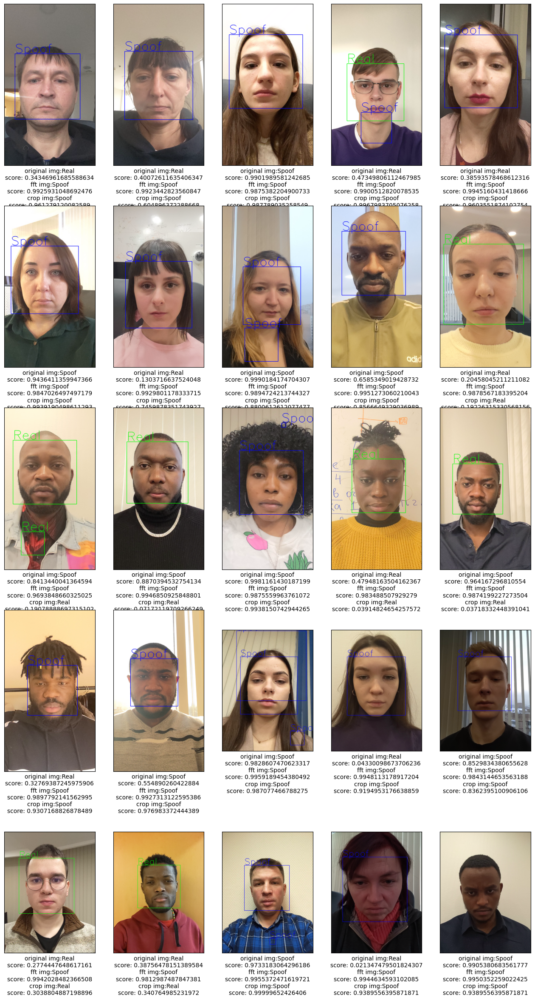

In [ ]:
# Create a figure to display images
pic_box = plt.figure(figsize=(16, 36))
new_path = f'{wdir}/users'

# Iterate through users and extract frames
for i, user in enumerate(sorted(os.listdir(new_path))):
    cap = cv2.VideoCapture(os.path.join(new_path, user))
    is_read, frame = cap.read()
    if is_read:
        picture = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        prediction_original = validate_prediction(predict_spoof(picture, loaded_pipeline))
        label_original = 'Real' if prediction_original < 0.5 else 'Spoof'

        prediction_fft = validate_prediction(predict_spoof(compute_fourier_transform(picture), loaded_pipeline))
        label_fft = 'Real' if prediction_fft < 0.5 else 'Spoof'

        # Detect faces in the frame
        faces = detect_faces(picture)

        # Predict if each face is real or spoof
        for (x, y, w, h) in faces:
            face = picture[y:y+h, x:x+w]
            prediction = validate_prediction(predict_spoof(face, loaded_pipeline))
            label = 'Real' if prediction < 0.5 else 'Spoof'

            # Draw bounding box and label on the image
            color = (0, 255, 0) if label == 'Real' else (0, 0, 255)
            cv2.rectangle(picture, (x, y), (x+w, y+h), color, 3)
            cv2.putText(picture, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 5, color, 3)

        # Add the image to the subplot
        pic_box.add_subplot(len(os.listdir(new_path))//5+1, 5, i+1)
        # plt.Text(f"label: {label}", fontsize=16)
        plt.imshow(picture)
        plt.xticks([])
        plt.yticks([])
        plt.xlabel(f'original img:{label_original}\nscore: {prediction_original}\nfft img:{label_fft}\nscore: {prediction_fft}\ncrop img:{label}\nscore: {prediction}')

        # Append results to the list
        prediction_results.append([user, 'real', 1-prediction_original, 1-prediction, 1-prediction_fft])

plt.show()


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 52.72it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 31.23it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 40.54it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 69.92it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.72it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 78.47it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 32.25it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 40.10it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 149.03it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  6.55it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 59.88it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 31.77it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 41.18it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 66.63it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 65.42it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 27.63it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 42.36it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 55.53it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.49it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 65.92it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.36it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 30.37it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 43.05it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 80.71it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 81.29it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 29.80it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 46.96it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 61.46it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.92it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 46.71it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 32.89it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 43.31it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 143.34it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.84it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 63.19it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.43it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 31.33it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 34.75it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 59.41it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 47.71it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 17.59it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 24.80it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 98.10it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 33.28it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 15.47it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 30.35it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 45.36it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.39it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 37.47it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.49it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 12.87it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 26.87it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 36.22it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 70.46it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 25.49it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 42.55it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 98.69it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 50.74it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.34it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 30.44it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 41.71it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 72.34it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.24it/s]


Applying LBP...


100%|██████████| 1/1 [00:00<00:00, 66.00it/s]


Applying Face Detector...


100%|██████████| 1/1 [00:00<00:00,  3.24it/s]


Applying Gabor...


100%|██████████| 1/1 [00:00<00:00, 28.61it/s]


Applying DOG...


100%|██████████| 1/1 [00:00<00:00, 37.91it/s]


Applying SIFT...


100%|██████████| 1/1 [00:00<00:00, 81.77it/s]


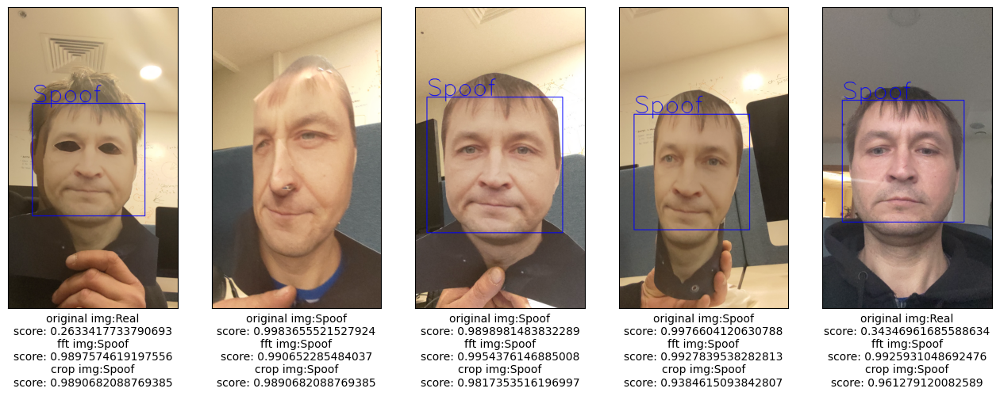

In [ ]:
# Create a figure to display images
pic_box = plt.figure(figsize=(16, 36))
new_path = f'{wdir}/exps'

# Iterate through users and extract frames
for i, user in enumerate(sorted(os.listdir(new_path))):
    cap = cv2.VideoCapture(os.path.join(new_path, user))
    is_read, frame = cap.read()
    if is_read:
        picture = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        prediction_original = validate_prediction(predict_spoof(picture, loaded_pipeline))
        label_original = 'Real' if prediction_original < 0.5 else 'Spoof'

        prediction_fft = validate_prediction(predict_spoof(compute_fourier_transform(picture), loaded_pipeline))
        label_fft = 'Real' if prediction_fft < 0.5 else 'Spoof'

        # Detect faces in the frame
        faces = detect_faces(picture)

        # Predict if each face is real or spoof
        for (x, y, w, h) in faces:
            face = picture[y:y+h, x:x+w]
            prediction = validate_prediction(predict_spoof(face, loaded_pipeline))
            label = 'Real' if prediction < 0.5 else 'Spoof'

            # Draw bounding box and label on the image
            color = (0, 255, 0) if label == 'Real' else (0, 0, 255)
            cv2.rectangle(picture, (x, y), (x+w, y+h), color, 3)
            cv2.putText(picture, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 5, color, 3)

        # Add the image to the subplot
        pic_box.add_subplot(len(os.listdir(new_path))//5+1, 5, i+1)
        # plt.Text(f"label: {label}", fontsize=16)
        plt.imshow(picture)
        plt.xticks([])
        plt.yticks([])
        plt.xlabel(f'original img:{label_original}\nscore: {prediction_original}\nfft img:{label_fft}\nscore: {prediction_fft}\ncrop img:{label}\nscore: {prediction}')

        # Append results to the list
        prediction_results.append([user, 'spoof', 1-prediction_original, 1-prediction, 1-prediction_fft])

plt.show()


In [ ]:
# Save the predictions to a CSV file
df = pd.DataFrame(prediction_results, columns=['video_file', 'Ground Truth', 'liveness_score', 'liveness_score_crop', 'liveness_score_frequency'])
df.to_csv('predictions_features.csv', index=False)

In [ ]:
df

,video_file,Ground Truth,liveness_score,liveness_score_crop,liveness_score_frequency
0,user026.mp4,real,0.656530,0.038721,0.007407
1,user027.mp4,real,0.599274,0.395104,0.007656
2,user028.mp4,real,0.009801,0.012211,0.012462
3,user029.mp4,real,0.526502,0.003202,0.009949
4,user030.mp4,real,0.614064,0.039645,0.005484
5,user031.mp4,real,0.056359,0.006081,0.015297
6,user032.mp4,real,0.869628,0.254012,0.007020
7,user033.mp4,real,0.000982,0.119939,0.010528
8,user034.mp4,real,0.341465,0.143335,0.004873
9,user035.mp4,real,0.795420,0.807737,0.012143
